## Packages

In [0]:
import pyspark
from pyspark.sql import functions as F
from pyspark.sql import Window
from pyspark.sql.functions import collect_list, concat_ws, udf ,lit, col, when, split, size, lower, explode
from pyspark.sql.types import *
from pyspark.sql import SparkSession, Row	
from pyspark.sql.types import MapType, StringType, StructType,StructField
from pyspark.sql.functions import sum as spark_sum

from pathlib import Path
import pyarrow.parquet as pq
import re
import string

import pandas as pd
import os
import numpy as np

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

from wordcloud import WordCloud
from collections import Counter
from textwrap import wrap

## Intro
- sentiment
- fweek
- fshortmonthname
- surveyscore
- queryresolved
- teammanagername
- workgroupname
- deptmanager
- generalmanager
- categories
- sentimentscore
- DepartmentName - TeamName

## data frame

In [0]:
directory = Path("/dbfs/FileStore/tables/john_marshman/contactcentre_yw")

df_all_pd = pd.concat(
    pd.read_parquet(parquet_file) for parquet_file in directory.glob("*.parquet")
)

df_all_pd.display()

df_all = spark.createDataFrame(df_all_pd)
df_all.createOrReplaceTempView("df_all")

llm_response,sentiment,summary,word_count,fweek,week,season,fyear,year,Quarter,fshortmonthname,ShortMonthName,Comment,SurveyScore,QueryResolved,AgentDisplayName,Agent_Email_Address,user_id,TeamManager,CallID,WorkgroupName,DeptManager,created,date,CSATScore2,QueryResolved2,AgentUsername,Department,TeamManagerName,GeneralManager,FullTimePartTimeIndicator,InteractionType,CallResponse,CallResolution,CallType,DepartmentName,id,AgentSite,LineManagerEmailAddress,DepartmentManagerEmailAddress,GeneralManagerEmailAddress,Appealed,Categories,SentimentScore,countryname
"The sentiment of the customer comment is confused, as they believed they had applied a discount code to their order but upon calling to check, they were left feeling uncertain about the outcome.",FP,as they believed they had applied a discount code to their order but upon calling to check they were left feeling uncertain about the outcome,23,22,26,SS,2024,2024,Qtr 2,Jun,6,i thought i had successfully applied a discount code to my order. i called to check but i am a bit confused.,5,No,Ayaz Shamsi,ayaz_shamsi@next.co.uk,78978993-e2f5-4e6c-acfe-657a7704ba8c,kcshaikh,00072c17-f445-42e5-af2a-f314924f92f8,Voice GNR,Athar Khan,2024-06-27T03:16:04.775Z,2024-06-27,100,0,ashamsi,UK Enquiries,Kaisaf Shaikh,Shreyas Parameshwaran,FT,call,null,null,null,UK Customer Service Team,1691003,Pune,Kaisaf_Shaikh@next.co.uk,Athar_Khan@next.co.uk,Shreyas_Parameshwaran@next.co.uk,None,"App,Order,Promotions",2,united_kingdom
"The sentiment of the customer comment is positive, as they expressed satisfaction with the helpful and supportive interaction they had with the contact center.",positive,as they expressed satisfaction with the helpful and supportive interaction they had with the contact center,23,21,25,SS,2024,2024,Qtr 2,Jun,6,"all my queries were answered, and extra advice and support with my purchase offered, it was good support for a large, purchase.",5,Yes,Abhijeet Shaw,abhijeet_shaw@next.co.uk,adcc1f34-527f-4672-afc1-d5f8f9295864,akadi,00441d32-a2f1-4992-baee-d0214bc7f548,Voice Orders,Felix Henry,2024-06-20T09:24:54.34Z,2024-06-20,100,100,aashaw,UK Enquiries,Akhil Kadi,Vijila Pillai,FT,call,order__place_an_order,null,enquiry_contact_type,UK Customer Service Team,1688218,Pune,Akhil_Kadi@next.co.uk,Felix_Henry@next.co.uk,Vijila_Pillai@next.co.uk,None,"Advice,Friendly,Compensation,Friendly,Advice",5,united_kingdom
"The sentiment of the customer comment is: positive. The reason is the use of praise for the quick answer, politeness, professionalism, and problem resolution.",positive,the reason is the use of praise for the quick answer politeness professionalism and problem resolution,30,18,22,SS,2024,2024,Qtr 2,May,5,as always next does what they promise my call was answered quickly sally was extremely polite professional and helpful and my problem was sorted out immediately well done next,5,Yes,Sally Steers,sally_steers@next.co.uk,f1cd7adc-c4d7-435c-950f-afe510b56555,ymaharjan,004bfe29-30d5-4eb2-8627-03dbb055c8f7,Voice Enquiries,Susan Lister,2024-05-30T09:53:06.121Z,2024-05-30,100,100,ssteers,UK Enquiries,Yamuna Maharjan,Mark Lambert,FT,call,returns__request_returns_label,null,enquiry_contact_type,UK Customer Service Team,1679481,Doncaster 2 (Online),Yamuna_Maharjan@next.co.uk,Susan_Lister@next.co.uk,Mark_Lambert@next.co.uk,None,"professional,helpful,Speed,Effective",5,united_kingdom
"The sentiment of the customer comment is positive, as the customer describes the interaction as pleasant, friendly, and quick.",positive,as the customer describes the interaction as pleasant friendly and quick,24,24,28,SS,2024,2024,Qtr 2,Jul,7,"the lady i spoke to was pleasant, friendly and resolved my problem very quickly. it was all sorted in less than 3 minutes.",5,Yes,Sophie Sigsworth,sophie_sigsworth@next.co.uk,5c8a7138-f7ac-4e3b-8737-785ce33eba59,ymaharjan,0105fd31-184c-435b-b20d-6fda2364e7b6,Voice Gift Card,Susan Lister,2024-07-12T07:30:15.238Z,2024-07-12,100,100,ssigsworth,UK Enquiries,Yamuna Maharjan,Ma

In [0]:
df_columns = [
    "WorkgroupName",
    "GeneralManager",
    "Department",
    "DeptManager",
    "DepartmentName",
    "TeamManagerName",
    "QueryResolved",
    "sentiment",
    "SurveyScore",
    "SentimentScore",
    "fshortmonthname",
    "fweek",
    "Categories",
]

df = df_all.select(*[col(column) for column in df_columns])

df = df.withColumnRenamed("DepartmentName", "TeamName")
df.createOrReplaceTempView("df")
df.display()

WorkgroupName,GeneralManager,Department,DeptManager,TeamName,TeamManagerName,QueryResolved,sentiment,SurveyScore,SentimentScore,fshortmonthname,fweek,Categories
Voice GNR,Shreyas Parameshwaran,UK Enquiries,Athar Khan,UK Customer Service Team,Kaisaf Shaikh,No,FP,5,2,Jun,22,"App,Order,Promotions"
Voice Orders,Vijila Pillai,UK Enquiries,Felix Henry,UK Customer Service Team,Akhil Kadi,Yes,positive,5,5,Jun,21,"Advice,Friendly,Compensation,Friendly,Advice"
Voice Enquiries,Mark Lambert,UK Enquiries,Susan Lister,UK Customer Service Team,Yamuna Maharjan,Yes,positive,5,5,May,18,"professional,helpful,Speed,Effective"
Voice Gift Card,Mark Lambert,UK Enquiries,Susan Lister,UK Customer Service Team,Yamuna Maharjan,Yes,positive,5,5,Jul,24,"Effective,Resolve,Issue,Resolve,Issue,Friendly,Issue,Polite"
Chat Pune,Vijila Pillai,UK Enquiries,Felix Henry,UK Customer Service Team,Daniel Joseph,Yes,positive,5,5,Jun,20,"On-time delivery,helpful,Items,Refund,Items,General communication"
Voice VIP Enquiries,Vijila Pillai,UK Enquiries,Vivek Chatwani,UK Customer Service Team,Carolyn Manuel,Yes,positive,5,4,Jun,23,Effective
Voice GNR,Kevin Holmes,UK Enquiries,Leanne Ryan,UK Customer Service Team,Hannah Kitchener,No,negative,5,3,Jun,21,"On-time delivery,helpful,helpful"
Voice GNR,Bharat Lalwani,UK Enquiries,Vivek Chatwani,UK Customer Service Team,Apeksha Bansal,Yes,positive,4,3,Jul,24,"General communication,Poor line,Staff"
Voice Enquiries,Nigel Newman,Chat Enquiries,Pushpa Patel,UK Customer Service Team,Tracey Smith,Yes,positive,5,5,Jun,21,"Effective,Resolve"
Chat Pune,Vijila Pillai,UK Enquiries,Ajay Tawrani,UK Customer Service Team,Pradepta Jena,Yes,neutral,4,3,Jul,23,"Resolve,Resolve,Items"


run above to start

---

### 1. dept manager + sentiment

In [0]:
dept_pivot = spark.sql(
    "SELECT * FROM (SELECT Department, deptmanager, sentiment FROM df) AS a PIVOT (COUNT(*) AS count FOR sentiment IN ('positive', 'negative', 'neutral'))"
)

dept_pivot.createOrReplaceTempView("dept_pivot")
dept_pivot.display()

Department,deptmanager,positive,negative,neutral
UK Enquiries,Shreyas Parameshwaran,31,18,null
Enquiries TP UK,Katie Shute,144,42,2
Chat Enquiries,null,3,null,null
UK Enquiries,Pushpa Patel,56,12,null
Chat Enquiries,Pushpa Patel,153,30,1
UK Enquiries,Susan Lister,153,25,null
Enquiries TP UK,Max Evans,226,62,2
UK Enquiries,Felix Henry,243,55,3
UK Enquiries,Athar Khan,157,40,1
UK Enquiries,Ajay Tawrani,134,52,3


In [0]:
dept_pd = dept_pivot.toPandas()
dept_pd.fillna(0, inplace=True)
dept_spark = spark.createDataFrame(dept_pd)
dept_pivot = dept_pivot.fillna(0)

/databricks/spark/python/pyspark/sql/pandas/conversion.py:413: UserWarning: createDataFrame attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Expected bytes, got a 'int' object
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
  warn(msg)


In [0]:
from pyspark.sql.functions import sum as spark_sum

grouped_dept_pivot = dept_pivot.groupBy("Department", "deptmanager").agg(
    spark_sum("positive").alias("positive"),
    spark_sum("negative").alias("negative"),
    spark_sum("neutral").alias("neutral")
)

grouped_dept_pivot.display()

Department,deptmanager,positive,negative,neutral
UK Enquiries,Shreyas Parameshwaran,31,18,0
Enquiries TP UK,Katie Shute,144,42,2
Chat Enquiries,null,3,0,0
UK Enquiries,Pushpa Patel,56,12,0
Chat Enquiries,Pushpa Patel,153,30,1
UK Enquiries,Susan Lister,153,25,0
Enquiries TP UK,Max Evans,226,62,2
UK Enquiries,Felix Henry,243,55,3
UK Enquiries,Athar Khan,157,40,1
UK Enquiries,Ajay Tawrani,134,52,3


In [0]:
dept_grouped_pd = grouped_dept_pivot.toPandas()

dept_grouped_pd['total'] = dept_grouped_pd['positive'] + dept_grouped_pd['negative'] + dept_grouped_pd['neutral']
dept_grouped_pd['percentage_positive'] = round(dept_grouped_pd['positive'] / dept_grouped_pd['total'] * 100, 1)
dept_grouped_pd['percentage_negative'] = round(dept_grouped_pd['negative'] / dept_grouped_pd['total'] * 100, 1)
dept_grouped_pd['percentage_neutral'] = round(dept_grouped_pd['neutral'] / dept_grouped_pd['total'] * 100, 1)

dept_grouped_pd.drop(columns=['total'], inplace=True)

display(dept_grouped_pd)

Department,deptmanager,positive,negative,neutral,percentage_positive,percentage_negative,percentage_neutral
UK Enquiries,Shreyas Parameshwaran,31,18,0,63.3,36.7,0.0
Enquiries TP UK,Katie Shute,144,42,2,76.6,22.3,1.1
Chat Enquiries,null,3,0,0,100.0,0.0,0.0
UK Enquiries,Pushpa Patel,56,12,0,82.4,17.6,0.0
Chat Enquiries,Pushpa Patel,153,30,1,83.2,16.3,0.5
UK Enquiries,Susan Lister,153,25,0,86.0,14.0,0.0
Enquiries TP UK,Max Evans,226,62,2,77.9,21.4,0.7
UK Enquiries,Felix Henry,243,55,3,80.7,18.3,1.0
UK Enquiries,Athar Khan,157,40,1,79.3,20.2,0.5
UK Enquiries,Ajay Tawrani,134,52,3,70.9,27.5,1.6


##### stacked bar plot

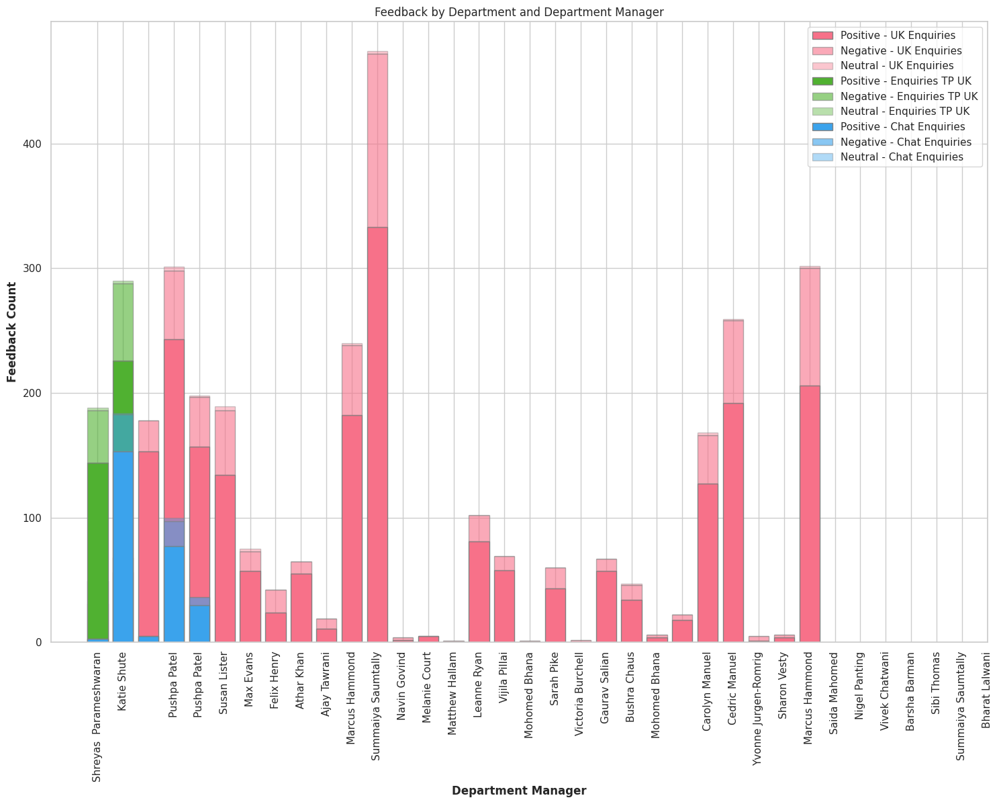

In [0]:
grouped_dept_pivot_pd = grouped_dept_pivot.toPandas()
palette = sns.color_palette("husl", len(grouped_dept_pivot_pd['Department'].unique()))

department_colors = dict(zip(grouped_dept_pivot_pd['Department'].unique(), palette))

plt.figure(figsize=(18, 12))

for department, color in department_colors.items():
    subset = grouped_dept_pivot_pd[grouped_dept_pivot_pd['Department'] == department]
    r = range(len(subset))
    plt.bar(r, subset['positive'], color=color, edgecolor='grey', width=0.8, label=f'Positive - {department}')
    plt.bar(r, subset['negative'], bottom=subset['positive'], color=color, edgecolor='grey', width=0.8, alpha=0.6, label=f'Negative - {department}')
    plt.bar(r, subset['neutral'], bottom=subset['positive'] + subset['negative'], color=color, edgecolor='grey', width=0.8, alpha=0.4, label=f'Neutral - {department}')


plt.xlabel('Department Manager', fontweight='bold')
plt.xticks([r for r in range(len(grouped_dept_pivot_pd))], grouped_dept_pivot_pd['deptmanager'], rotation=90)
plt.ylabel('Feedback Count', fontweight='bold')
plt.title('Feedback by Department and Department Manager')
plt.legend()

plt.show()

#### 1.1 dept - sentiment

In [0]:
dept_pivot_pd = dept_pivot.toPandas()

# Replace null values with 0
dept_pivot_pd.fillna(0, inplace=True)

# Group by Department
grouped_dept = dept_pivot_pd.groupby('Department').sum().reset_index()

# Define a color palette with low saturation
palette = sns.color_palette("pastel", len(grouped_dept['Department'].unique()))

# Plotting a grouped bar chart for department sentiment
plt.figure(figsize=(12, 8))

bar_width = 0.2
r1 = range(len(grouped_dept))

plt.bar(r1, grouped_dept['positive'], color=palette[0], width=bar_width, edgecolor='grey', label='Positive')
plt.bar(r1, grouped_dept['negative'], bottom=grouped_dept['positive'], color=palette[1], width=bar_width, edgecolor='grey', label='Negative')
plt.bar(r1, grouped_dept['neutral'], bottom=grouped_dept['positive'] + grouped_dept['negative'], color=palette[2], width=bar_width, edgecolor='grey', label='Neutral')

plt.xlabel('Department', fontweight='bold')
plt.xticks(r1, grouped_dept['Department'], rotation=45)
plt.ylabel('Feedback Count', fontweight='bold')
plt.title('Department-wise Sentiment Analysis')
plt.legend()

plt.tight_layout()
plt.show()


---------------------------------------------------------------------------
KeyError                                  Traceback (most recent call last)
File <command-3066253989244788>, line 7
      4 dept_pivot_pd.fillna(0, inplace=True)
      6 # Group by Department
----> 7 grouped_dept = dept_pivot_pd.groupby('Department').sum().reset_index()
      9 # Define a color palette with low saturation
     10 palette = sns.color_palette("pastel", len(grouped_dept['Department'].unique()))

File /databricks/python/lib/python3.10/site-packages/pandas/core/frame.py:8402, in DataFrame.groupby(self, by, axis, level, as_index, sort, group_keys, squeeze, observed, dropna)
   8399     raise TypeError("You have to supply one of 'by' and 'level'")
   8400 axis = self._get_axis_number(axis)
-> 8402 return DataFrameGroupBy(
   8403     obj=self,
   8404     keys=by,
   8405     axis=axis,
   8406     level=level,
   8407     as_index=as_index,
   8408     sort=sort,
   8409     group_keys=group_keys,
  

/root/.ipykernel/395880/command-3369264611671649-1044502035:23: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


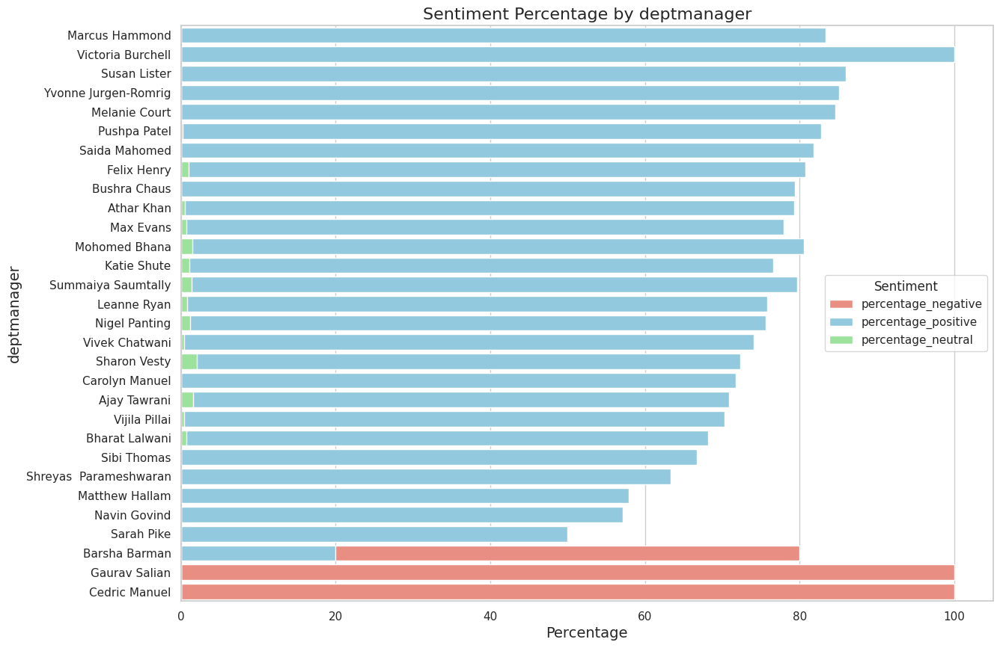

In [0]:
dept_grouped_pd = dept_grouped_pd[dept_grouped_pd["deptmanager"].notna()]
dept_grouped_pd = dept_grouped_pd[dept_grouped_pd["deptmanager"] != "null"]

dept_grouped_pd_melted = dept_grouped_pd.melt(
    id_vars=["deptmanager"],
    value_vars=["percentage_positive", "percentage_negative", "percentage_neutral"],
    var_name="Sentiment",
    value_name="Percentage",
)

dept_grouped_pd_melted["percentage_positive"] = dept_grouped_pd_melted.apply(
    lambda row: dept_grouped_pd[dept_grouped_pd["deptmanager"] == row["deptmanager"]][
        "percentage_positive"
    ].values[0],
    axis=1,
)
dept_grouped_pd_melted = dept_grouped_pd_melted.sort_values(
    by="percentage_positive", ascending=False
)


plt.figure(figsize=(14, 10))
sns.barplot(
    data=dept_grouped_pd_melted,
    y="deptmanager",
    x="Percentage",
    hue="Sentiment",
    ci=None,
    palette=["salmon", "skyblue", "lightgreen"],
    dodge=False
)


plt.title("Sentiment Percentage by deptmanager", fontsize=16)
plt.ylabel("deptmanager", fontsize=14)
plt.xlabel("Percentage", fontsize=14)
plt.legend(title="Sentiment")
plt.show()

/root/.ipykernel/395880/command-3369264611672039-4282201980:23: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(


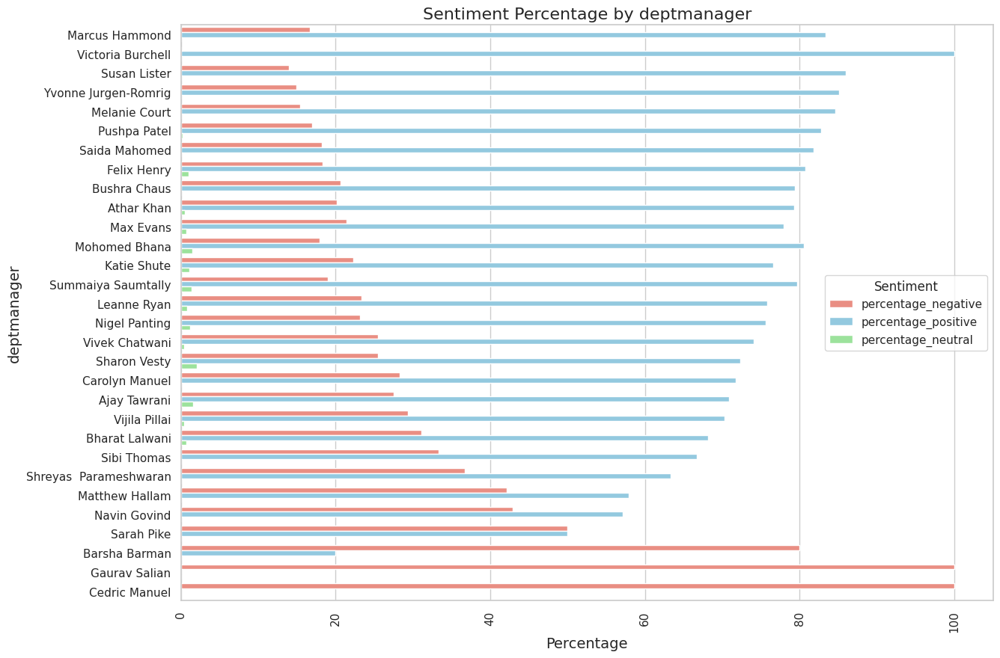

In [0]:
dept_grouped_pd = dept_grouped_pd[dept_grouped_pd["deptmanager"].notna()]
dept_grouped_pd = dept_grouped_pd[dept_grouped_pd["deptmanager"] != "null"]

dept_grouped_pd_melted = dept_grouped_pd.melt(
    id_vars=["deptmanager"],
    value_vars=["percentage_positive", "percentage_negative", "percentage_neutral"],
    var_name="Sentiment",
    value_name="Percentage",
)

dept_grouped_pd_melted["percentage_positive"] = dept_grouped_pd_melted.apply(
    lambda row: dept_grouped_pd[dept_grouped_pd["deptmanager"] == row["deptmanager"]][
        "percentage_positive"
    ].values[0],
    axis=1,
)
dept_grouped_pd_melted = dept_grouped_pd_melted.sort_values(
    by="percentage_positive", ascending=False
)


plt.figure(figsize=(14, 10))
sns.barplot(
    data=dept_grouped_pd_melted,
    y="deptmanager",
    x="Percentage",
    hue="Sentiment",
    ci=None,
    palette=["salmon", "skyblue", "lightgreen"],
)


plt.title("Sentiment Percentage by deptmanager", fontsize=16)
plt.ylabel("deptmanager", fontsize=14)
plt.xlabel("Percentage", fontsize=14)
plt.xticks(rotation=90)
plt.legend(title="Sentiment")
plt.show()

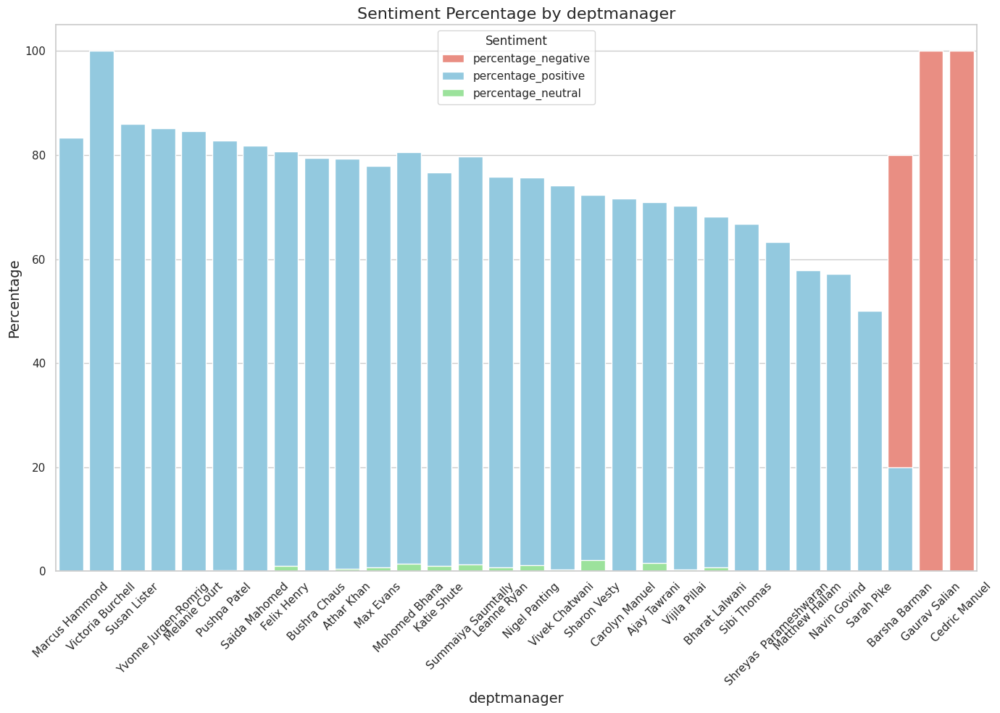

In [0]:
dept_grouped_pd = dept_grouped_pd[dept_grouped_pd["deptmanager"].notna()]
dept_grouped_pd = dept_grouped_pd[dept_grouped_pd["deptmanager"] != "null"]

dept_grouped_pd_melted = dept_grouped_pd.melt(
    id_vars=["deptmanager"],
    value_vars=["percentage_positive", "percentage_negative", "percentage_neutral"],
    var_name="Sentiment",
    value_name="Percentage",
)

dept_grouped_pd_melted["percentage_positive"] = dept_grouped_pd_melted.apply(
    lambda row: dept_grouped_pd[dept_grouped_pd["deptmanager"] == row["deptmanager"]][
        "percentage_positive"
    ].values[0],
    axis=1,
)
dept_grouped_pd_melted = dept_grouped_pd_melted.sort_values(
    by="percentage_positive", ascending=False
)


plt.figure(figsize=(14, 10))
sns.barplot(
    data=dept_grouped_pd_melted,
    x="deptmanager",
    y="Percentage",
    hue="Sentiment",
    errorbar=None,
    dodge=False,
    palette=["salmon", "skyblue", "lightgreen"],
)


plt.title("Sentiment Percentage by deptmanager", fontsize=16)
plt.xlabel("deptmanager", fontsize=14)
plt.ylabel("Percentage", fontsize=14)
plt.xticks(rotation=45)
plt.legend(title="Sentiment")
plt.tight_layout()
plt.show()

In [0]:

sns.barplot(
    data=dept_pivot_pd_melted,
    x="deptmanager",
    y="Percentage",
    hue="Sentiment",
    errorbar=None,
    dodge=False,
    palette=["salmon", "skyblue", "lightgreen"],
    ax=ax1
)

# Setting up the bar plot axis labels
ax1.set_title("Sentiment Percentage by deptmanager", fontsize=16)
ax1.set_xlabel("deptmanager", fontsize=14)
ax1.set_ylabel("Percentage", fontsize=14)
ax1.tick_params(axis='x', rotation=45)
ax1.legend(title="Sentiment")

# Create a second y-axis
ax2 = ax1.twinx()

# Scatter plot on the second y-axis
sns.scatterplot(
    data=dept_pivot_pd_melted,
    x="deptmanager",
    y="total",
    color="black",
    s=100,
    marker="o",
    ax=ax2
)

# Setting up the scatter plot axis labels
ax2.set_ylabel("Total", fontsize=14)
ax2.grid(False)  # Disable the grid on the scatter plot

plt.tight_layout()
plt.show()


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3369264611889387>, line 2
      1 sns.barplot(
----> 2     data=dept_pivot_pd_melted,
      3     x="deptmanager",
      4     y="Percentage",
      5     hue="Sentiment",
      6     errorbar=None,
      7     dodge=False,
      8     palette=["salmon", "skyblue", "lightgreen"],
      9     ax=ax1
     10 )
     12 # Setting up the bar plot axis labels
     13 ax1.set_title("Sentiment Percentage by deptmanager", fontsize=16)

NameError: name 'dept_pivot_pd_melted' is not defined

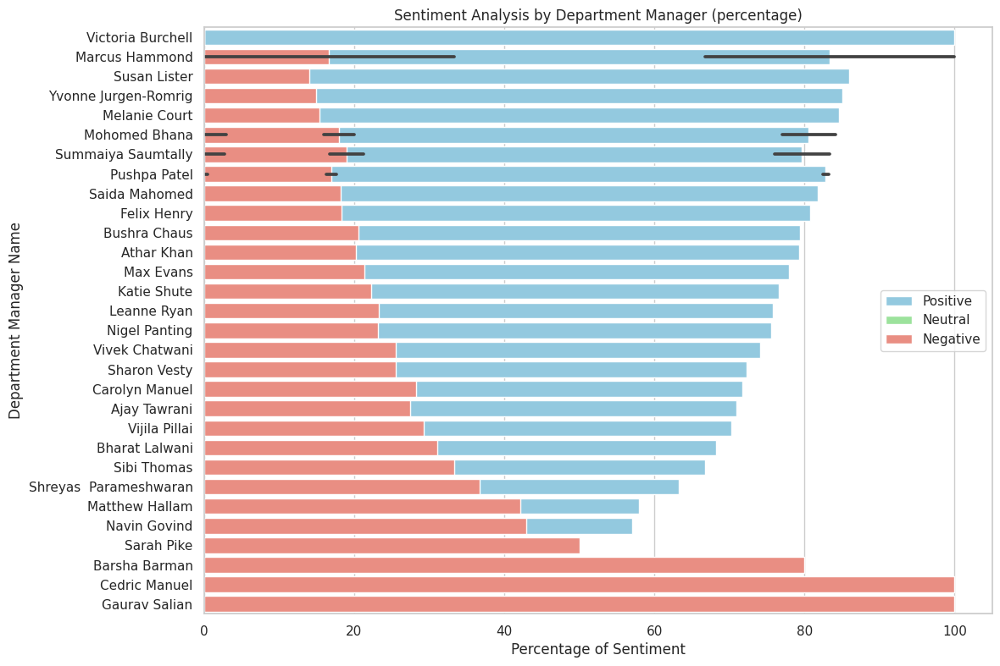

In [0]:
dept_grouped_pd_sorted = dept_grouped_pd.sort_values(
    by="percentage_positive", ascending=False
)

plt.figure(figsize=(12, 9))
sns.set_theme(style="whitegrid")

sns.barplot(
    data=dept_grouped_pd_sorted,
    y="deptmanager",
    x="percentage_positive",
    color="skyblue",
    label="Positive",
)
sns.barplot(
    data=dept_grouped_pd_sorted,
    y="deptmanager",
    x="percentage_neutral",
    color="lightgreen",
    label="Neutral",
)
sns.barplot(
    data=dept_grouped_pd_sorted,
    y="deptmanager",
    x="percentage_negative",
    color="salmon",
    label="Negative",
)

plt.xlabel("Percentage of Sentiment")
plt.ylabel("Department Manager Name")
plt.title("Sentiment Analysis by Department Manager (percentage)")
plt.legend()

plt.show()

#### 1.2 heatmap - dept

##### by percentage

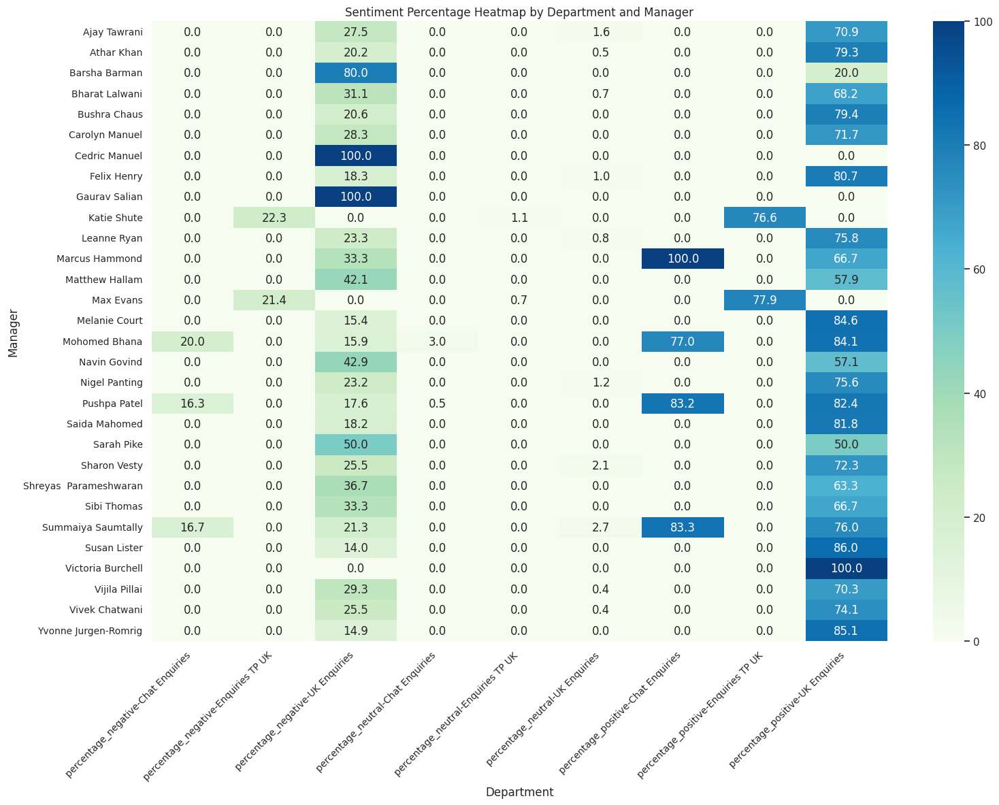

In [0]:
heatmap_data_percentage = dept_grouped_pd.pivot_table(index='deptmanager', columns='Department', values=['percentage_positive', 'percentage_negative', 'percentage_neutral'], fill_value=0)

plt.figure(figsize=(16, 12))
sns.heatmap(heatmap_data_percentage, annot=True, fmt=".1f", cmap="GnBu", cbar=True)
plt.title("Sentiment Percentage Heatmap by Department and Manager")
plt.xlabel("Department")
plt.ylabel("Manager")
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()

plt.show()

##### by volume

In [0]:
heatmap_data = grouped_dept_pivot_pd.pivot_table(index='deptmanager', columns='Department', values=['positive', 'negative', 'neutral'], fill_value=0)

plt.figure(figsize=(14, 10))
sns.heatmap(heatmap_data, annot=True, fmt="d", cmap="GnBu", cbar=True)
plt.title("Feedback Heatmap by Department and Manager")
plt.xlabel("Department")
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.ylabel("Manager")
plt.show()

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3066253989244812>, line 1
----> 1 heatmap_data = grouped_dept_pivot_pd.pivot_table(index='deptmanager', columns='Department', values=['positive', 'negative', 'neutral'], fill_value=0)
      3 plt.figure(figsize=(14, 10))
      4 sns.heatmap(heatmap_data, annot=True, fmt="d", cmap="GnBu", cbar=True)

NameError: name 'grouped_dept_pivot_pd' is not defined

##### Dept subplots - percentage + volume

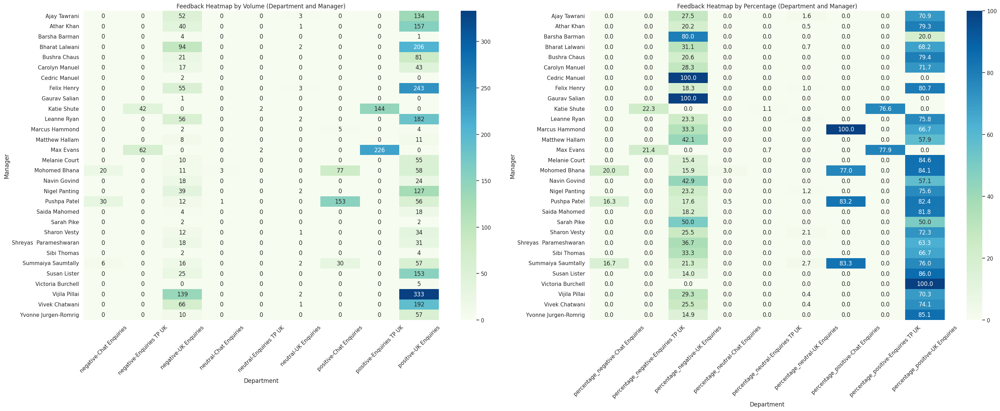

In [0]:
heatmap_data_volume = dept_grouped_pd.pivot_table(index='deptmanager', columns='Department', values=['positive', 'negative', 'neutral'], fill_value=0)
heatmap_data_percentage = dept_grouped_pd.pivot_table(index='deptmanager', columns='Department', values=['percentage_positive', 'percentage_negative', 'percentage_neutral'], fill_value=0)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 12))

# Volume heatmap
sns.heatmap(heatmap_data_volume, annot=True, fmt="d", cmap="GnBu", cbar=True, ax=ax1)
ax1.set_title("Feedback Heatmap by Volume (Department and Manager)")
ax1.set_xlabel("Department")
ax1.set_ylabel("Manager")
ax1.tick_params(axis='x', rotation=45)

# Percentage heatmap
sns.heatmap(heatmap_data_percentage, annot=True, fmt=".1f", cmap="GnBu", cbar=True, ax=ax2)
ax2.set_title("Feedback Heatmap by Percentage (Department and Manager)")
ax2.set_xlabel("Department")
ax2.set_ylabel("Manager")
ax2.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

---

### 2. Workgroup

#### 2.1 sentiment volume distribution (descending)

/root/.ipykernel/395880/command-3066253989252528-1773099875:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  workgroup_sen["Total"] = workgroup_sen.sum(axis=1)
/root/.ipykernel/395880/command-3066253989252528-1773099875:21: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  ax = sns.barplot(


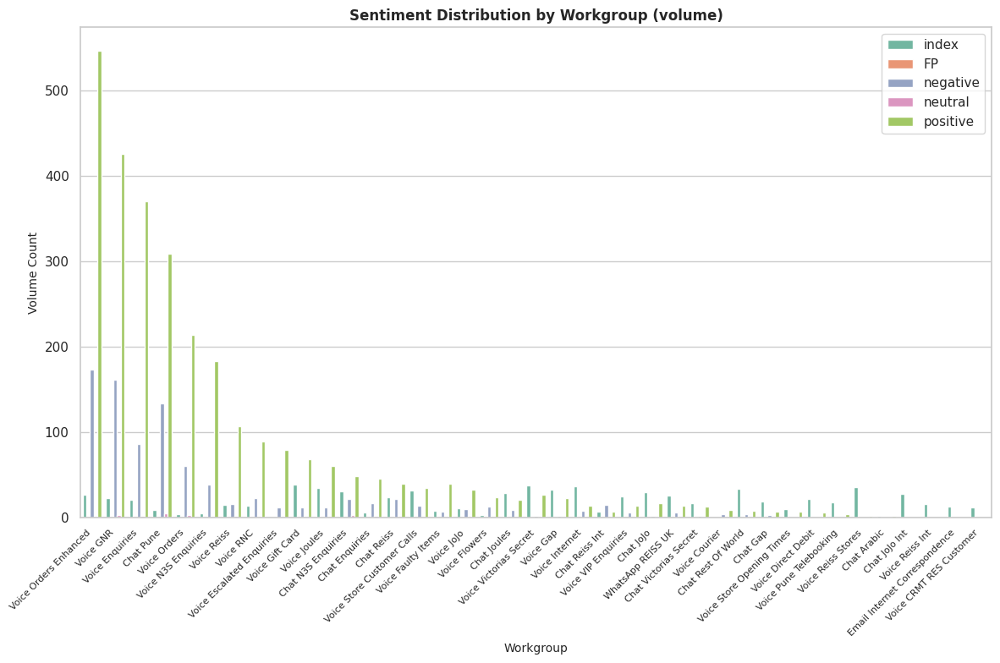

In [0]:
workgroup_sen = (
    df.groupby(["WorkgroupName", "sentiment"])
    .count()
    .groupBy("WorkgroupName")
    .pivot("sentiment")
    .sum()
)

workgroup_sen = workgroup_sen.toPandas()

workgroup_sen["Total"] = workgroup_sen.sum(axis=1)
workgroup_sen = workgroup_sen.sort_values("Total", ascending=False)
workgroup_sen = workgroup_sen.drop(columns=["Total"])
workgroup_sen = workgroup_sen.reset_index()

workgroup_sen_melted = workgroup_sen.melt(
    id_vars="WorkgroupName", var_name="Sentiment", value_name="Count"
)

plt.figure(figsize=(12, 8))
ax = sns.barplot(
    data=workgroup_sen_melted,
    x="WorkgroupName",
    y="Count",
    hue="Sentiment",
    palette="Set2",
    ci=None,
)

plt.title("Sentiment Distribution by Workgroup (volume)", fontsize=12, fontweight="bold")
plt.xlabel("Workgroup", fontsize=10)
plt.ylabel("Volume Count", fontsize=10)

plt.xticks(rotation=45, ha="right", fontsize=8)
plt.legend(loc='upper right')
plt.tight_layout()

plt.show()

#### 2.2 sentiment percentage distribution (descending)

In [0]:
workgroup_sen = (
    df.groupby(["WorkgroupName", "sentiment"])
    .count()
    .groupBy("WorkgroupName")
    .pivot("sentiment")
    .sum()
)

workgroup_grouped_pd = workgroup_sen.toPandas()
workgroup_grouped_pd.fillna(0, inplace=True)

workgroup_grouped_pd["total"] = (
    workgroup_grouped_pd["positive"]
    + workgroup_grouped_pd["negative"]
    + workgroup_grouped_pd["neutral"]
)
workgroup_grouped_pd["percentage_positive"] = round(
    workgroup_grouped_pd["positive"] / workgroup_grouped_pd["total"] * 100, 1
)
workgroup_grouped_pd["percentage_negative"] = round(
    workgroup_grouped_pd["negative"] / workgroup_grouped_pd["total"] * 100, 1
)
workgroup_grouped_pd["percentage_neutral"] = round(
    workgroup_grouped_pd["neutral"] / workgroup_grouped_pd["total"] * 100, 1
)

workgroup_grouped_pd.drop(columns=["total"], inplace=True)

display(workgroup_grouped_pd)

WorkgroupName,FP,negative,neutral,positive,percentage_positive,percentage_negative,percentage_neutral
Voice Escalated Enquiries,0.0,12.0,0.0,79.0,86.8,13.2,0.0
Voice Courier,0.0,4.0,0.0,9.0,69.2,30.8,0.0
Chat Arabic,0.0,0.0,0.0,2.0,100.0,0.0,0.0
Voice Flowers,0.0,13.0,0.0,23.0,63.9,36.1,0.0
Voice Orders,0.0,60.0,3.0,214.0,77.3,21.7,1.1
Voice N3S Enquiries,0.0,38.0,0.0,183.0,82.8,17.2,0.0
Chat Enquiries,0.0,17.0,2.0,45.0,70.3,26.6,3.1
Chat Reiss Int,0.0,15.0,0.0,7.0,31.8,68.2,0.0
Voice Faulty Items,0.0,7.0,0.0,39.0,84.8,15.2,0.0
Chat Pune,0.0,134.0,5.0,309.0,69.0,29.9,1.1


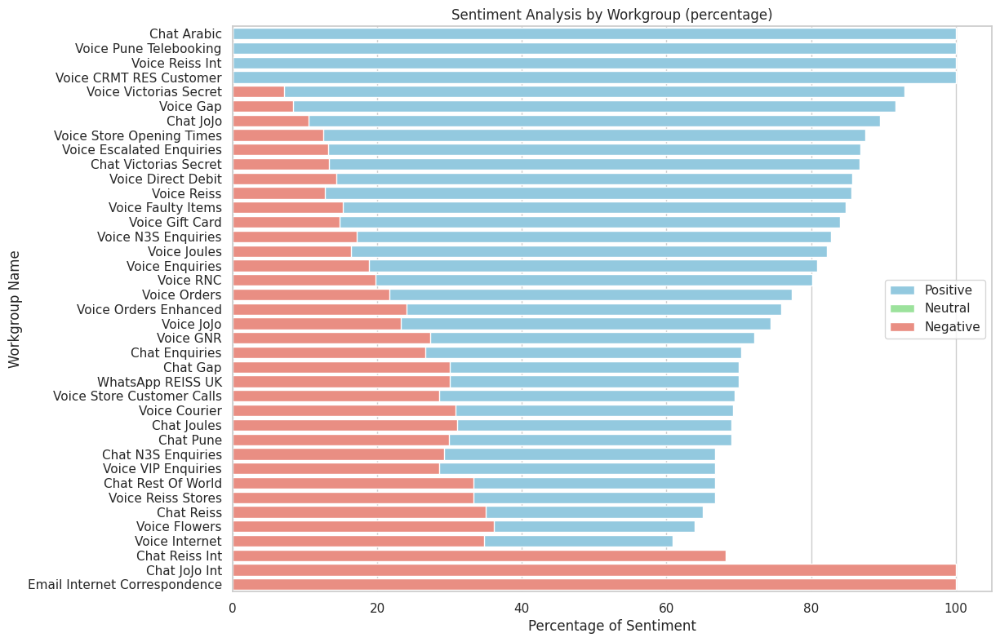

In [0]:
workgroup_grouped_pd_sorted = workgroup_grouped_pd.sort_values(
    by="percentage_positive", ascending=False
)

plt.figure(figsize=(12, 9))
sns.set_theme(style="whitegrid")

sns.barplot(
    data=workgroup_grouped_pd_sorted,
    y="WorkgroupName",
    x="percentage_positive",
    color="skyblue",
    label="Positive",
)
sns.barplot(
    data=workgroup_grouped_pd_sorted,
    y="WorkgroupName",
    x="percentage_neutral",
    color="lightgreen",
    label="Neutral",
)
sns.barplot(
    data=workgroup_grouped_pd_sorted,
    y="WorkgroupName",
    x="percentage_negative",
    color="salmon",
    label="Negative",
)

plt.xlabel("Percentage of Sentiment")
plt.ylabel("Workgroup Name")
plt.title("Sentiment Analysis by Workgroup (percentage)")
plt.legend()

plt.show()

### 3. General Manager

In [0]:
general_manager = (
    df.groupby(["GeneralManager", "sentiment"])
    .count()
    .groupBy("GeneralManager")
    .pivot("sentiment")
    .sum()
)

general_manager_pd = general_manager.toPandas()
general_manager_pd.fillna(0, inplace=True)

general_manager_pd["total"] = (
    general_manager_pd["positive"]
    + general_manager_pd["negative"]
    + general_manager_pd["neutral"]
)
general_manager_pd["percentage_positive"] = round(
    general_manager_pd["positive"] / general_manager_pd["total"] * 100, 1
)
general_manager_pd["percentage_negative"] = round(
    general_manager_pd["negative"] / general_manager_pd["total"] * 100, 1
)
general_manager_pd["percentage_neutral"] = round(
    general_manager_pd["neutral"] / general_manager_pd["total"] * 100, 1
)

general_manager_pd.drop(columns=["total"], inplace=True)

display(general_manager_pd)

/databricks/spark/python/pyspark/sql/pandas/conversion.py:413: UserWarning: createDataFrame attempted Arrow optimization because 'spark.sql.execution.arrow.pyspark.enabled' is set to true; however, failed by the reason below:
  Expected bytes, got a 'int' object
Attempting non-optimization as 'spark.sql.execution.arrow.pyspark.fallback.enabled' is set to true.
  warn(msg)


GeneralManager,FP,negative,neutral,positive,percentage_positive,percentage_negative,percentage_neutral
Jacob Dilkes,0.0,6,0.0,27.0,81.8,18.2,0.0
Athar Khan,0.0,17,0.0,43.0,71.7,28.3,0.0
Jolyon Hammond,1.0,42,2.0,144.0,76.6,22.3,1.1
Meghna Dhar Newbigging,0.0,1,0.0,0.0,0.0,100.0,0.0
0,0.0,1,0.0,3.0,75.0,25.0,0.0
Mark Lambert,0.0,124,2.0,429.0,77.3,22.3,0.4
Kashish Hooda,0.0,18,0.0,24.0,57.1,42.9,0.0
Matthew Barnes,0.0,8,0.0,11.0,57.9,42.1,0.0
Saida Mahomed,0.0,32,0.0,145.0,81.9,18.1,0.0
Sibi Thomas,0.0,7,0.0,3.0,30.0,70.0,0.0


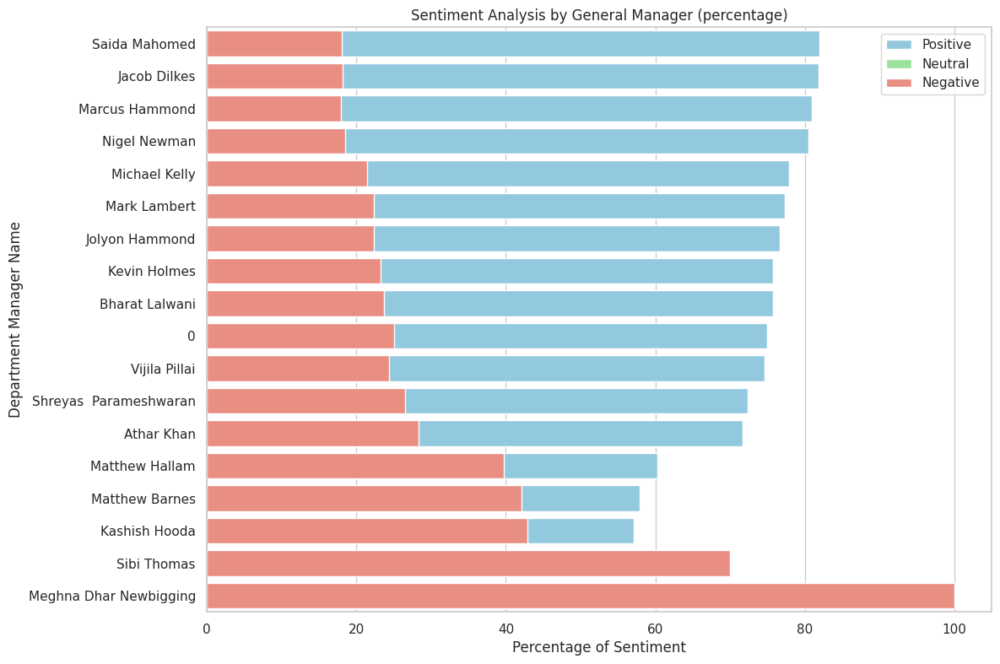

In [0]:
general_manager_pd_sorted = general_manager_pd.sort_values(
    by="percentage_positive", ascending=False
)

plt.figure(figsize=(12, 9))
sns.set_theme(style="whitegrid")

sns.barplot(
    data=general_manager_pd_sorted,
    y="GeneralManager",
    x="percentage_positive",
    color="skyblue",
    label="Positive",
)
sns.barplot(
    data=general_manager_pd_sorted,
    y="GeneralManager",
    x="percentage_neutral",
    color="lightgreen",
    label="Neutral",
)
sns.barplot(
    data=general_manager_pd_sorted,
    y="GeneralManager",
    x="percentage_negative",
    color="salmon",
    label="Negative",
)

plt.xlabel("Percentage of Sentiment")
plt.ylabel("Department Manager Name")
plt.title("Sentiment Analysis by General Manager (percentage)")
plt.legend()

plt.show()

### 4. Word cloud - Categories

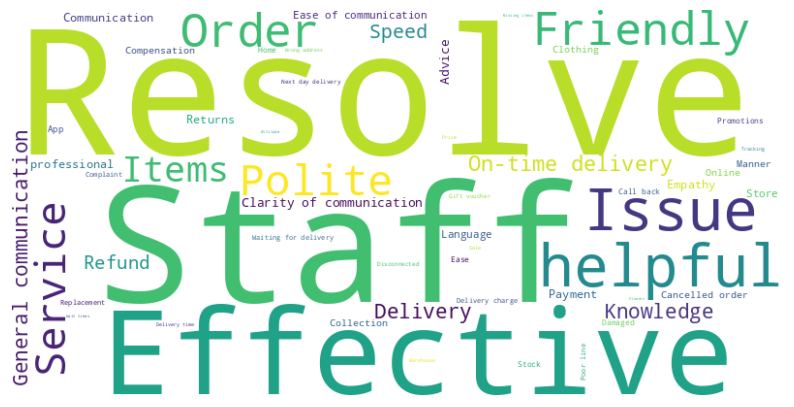

In [0]:
df = df.withColumn('Category', explode(split(df['Categories'], ',')))
category_counts = df.groupBy('Category').count().collect()

word_freq = {row['Category']: row['count'] for row in category_counts}

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)

plt.figure(figsize=(10, 6))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
#plt.title('Word Cloud of Customer Comments')
plt.show()

#### 4.1 Positive - Negative - Neutral **wordcloud**

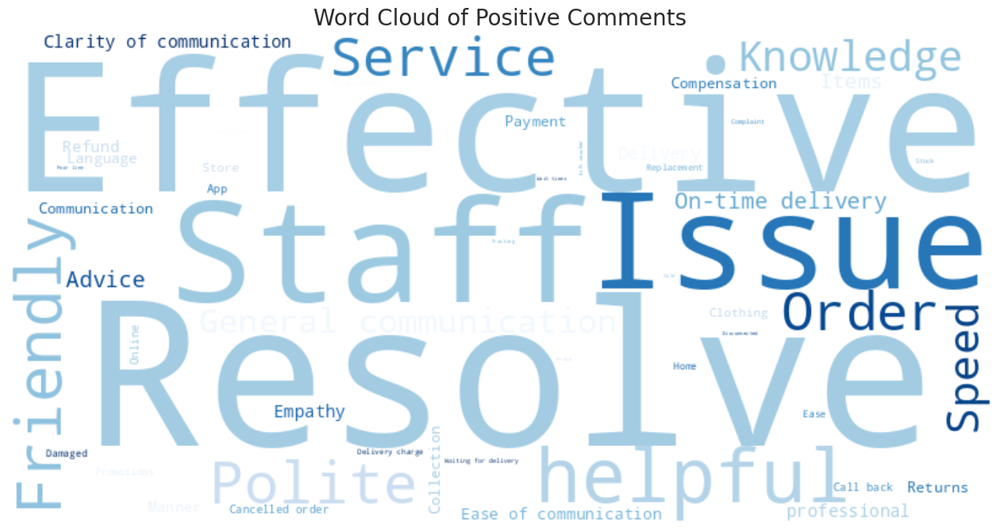

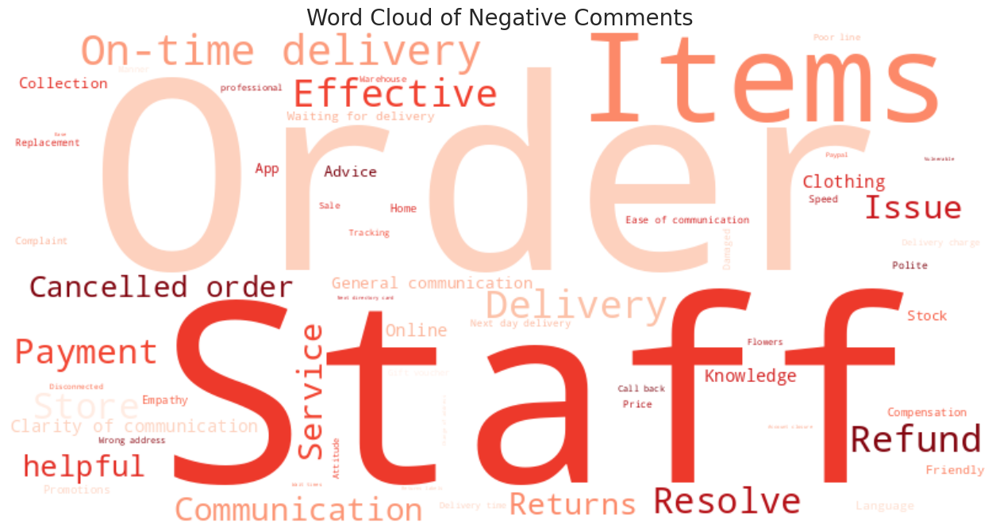

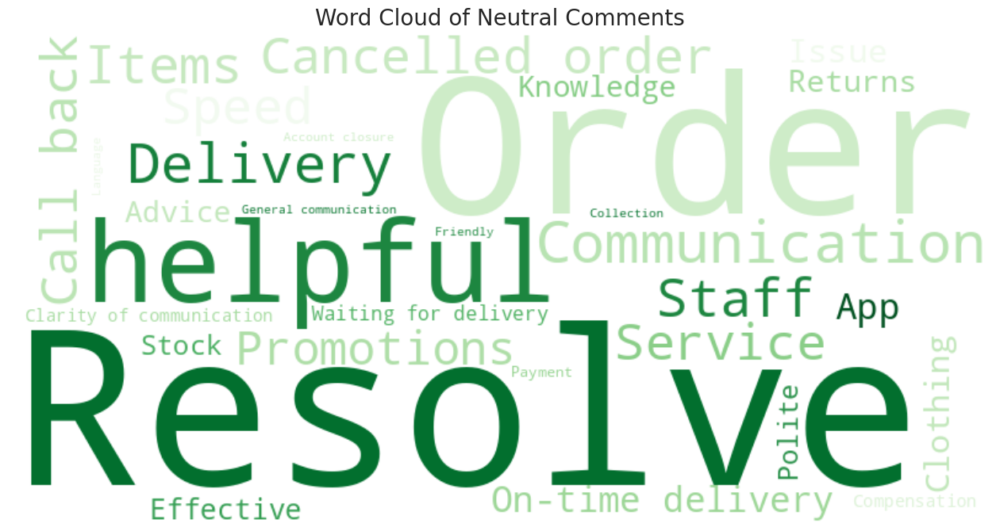

In [0]:
sentiments = ['positive', 'negative', 'neutral']

colormaps = {
    'positive': 'Blues',
    'negative': 'Reds',
    'neutral': 'Greens'
}

word_freqs = {}

for sentiment in sentiments:

    filtered_df = df.filter(df['sentiment'] == sentiment)
    filtered_df = filtered_df.withColumn('Category', F.explode(F.split(filtered_df['Categories'], ',')))
    category_counts = filtered_df.groupBy('Category').count().collect()
    word_freq = {row['Category']: row['count'] for row in category_counts}
    word_freqs[sentiment] = word_freq


for sentiment in sentiments:
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap=colormaps[sentiment], relative_scaling=0.5).generate_from_frequencies(word_freqs[sentiment])
    

    plt.figure(figsize=(16, 9))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud of {sentiment.capitalize()} Comments', fontsize=20)
    plt.axis('off')
    
    # 显示图形
    plt.show()


#### 4.2 Negetive wordcloud

#### 4.3 Neutral wordcloud

## Dash board 2*2

### 1. data sets

#### 1.1 department

In [0]:
dept_p = spark.sql(
    "SELECT * FROM (SELECT Department, sentiment FROM df) AS a PIVOT (COUNT(*) AS count FOR sentiment IN ('positive', 'negative', 'neutral'))"
)
dept_p.createOrReplaceTempView("dept_p")
dept_p.display()

dept_p_pd = dept_p.toPandas()
dept_p_pd["total"] = (
    dept_p_pd["positive"] + dept_p_pd["negative"] + dept_p_pd["neutral"]
)
dept_p_pd["percentage_positive"] = round(
    dept_p_pd["positive"] / dept_p_pd["total"] * 100, 1
)
dept_p_pd["percentage_negative"] = round(
    dept_p_pd["negative"] / dept_p_pd["total"] * 100, 1
)
dept_p_pd["percentage_neutral"] = round(
    dept_p_pd["neutral"] / dept_p_pd["total"] * 100, 1
)
dept_p_pd.drop(columns=["total"], inplace=True)
display(dept_p_pd)


dept_p_pd = dept_p_pd[dept_p_pd["Department"].notna()]
dept_p_pd = dept_p_pd[dept_p_pd["Department"] != "null"]

dept_p_pd_melted = dept_p_pd.melt(
    id_vars=["Department"],
    value_vars=["percentage_positive", "percentage_negative", "percentage_neutral"],
    var_name="Sentiment",
    value_name="Percentage",
)
dept_p_pd_melted["percentage_positive"] = dept_p_pd_melted.apply(
    lambda row: dept_p_pd[dept_p_pd["Department"] == row["Department"]][
        "percentage_positive"
    ].values[0],
    axis=1,
)
dept_p_pd_melted = dept_p_pd_melted.sort_values(
    by="percentage_positive", ascending=False
)

Department,positive,negative,neutral
Chat Enquiries,268,56,4
Enquiries TP UK,370,104,4
UK Enquiries,2268,737,19


Department,positive,negative,neutral,percentage_positive,percentage_negative,percentage_neutral
Chat Enquiries,268,56,4,81.7,17.1,1.2
Enquiries TP UK,370,104,4,77.4,21.8,0.8
UK Enquiries,2268,737,19,75.0,24.4,0.6


#### 1.2 dapartment manager

In [0]:
dept_pivot = spark.sql(
    "SELECT * FROM (SELECT deptmanager, sentiment FROM df) AS a PIVOT (COUNT(*) AS count FOR sentiment IN ('positive', 'negative', 'neutral'))"
)
spark = SparkSession.builder.appName("DropNulls").getOrCreate()
dept_pivot = dept_pivot.dropna(subset=["deptmanager"])
dept_pivot.createOrReplaceTempView("dept_pivot")
dept_pivot.display()

dept_pivot_pd = dept_pivot.toPandas()
dept_pivot_pd.fillna(0, inplace=True)
dept_pivot_pd["total"] = (
    dept_pivot_pd["positive"] + dept_pivot_pd["negative"] + dept_pivot_pd["neutral"]
)
dept_pivot_pd["percentage_positive"] = round(
    dept_pivot_pd["positive"] / dept_pivot_pd["total"] * 100, 1
)
dept_pivot_pd["percentage_negative"] = round(
    dept_pivot_pd["negative"] / dept_pivot_pd["total"] * 100, 1
)
dept_pivot_pd["percentage_neutral"] = round(
    dept_pivot_pd["neutral"] / dept_pivot_pd["total"] * 100, 1
)
#dept_pivot_pd.drop(columns=["total"], inplace=True)
display(dept_pivot_pd)


dept_pivot_pd = dept_pivot_pd[dept_pivot_pd["deptmanager"].notna()]
dept_pivot_pd = dept_pivot_pd[dept_pivot_pd["deptmanager"] != "null"]

dept_pivot_pd_melted = dept_pivot_pd.melt(
    id_vars=["deptmanager"],
    value_vars=["percentage_positive", "percentage_negative", "percentage_neutral"],
    var_name="Sentiment",
    value_name="Percentage",
)
dept_pivot_pd_melted["percentage_positive"] = dept_pivot_pd_melted.apply(
    lambda row: dept_pivot_pd[dept_pivot_pd["deptmanager"] == row["deptmanager"]][
        "percentage_positive"
    ].values[0],
    axis=1,
)
dept_pivot_pd_melted = dept_pivot_pd_melted.sort_values(
    by="percentage_positive", ascending=False
)

deptmanager,positive,negative,neutral
Athar Khan,157,40,1
Victoria Burchell,5,null,null
Melanie Court,55,10,null
Navin Govind,24,18,null
Bushra Chaus,81,21,null
Susan Lister,153,25,null
Yvonne Jurgen-Romrig,57,10,null
Leanne Ryan,182,56,2
Katie Shute,144,42,2
Sarah Pike,2,2,null


deptmanager,positive,negative,neutral,total,percentage_positive,percentage_negative,percentage_neutral
Athar Khan,157.0,40.0,1.0,198.0,79.3,20.2,0.5
Victoria Burchell,5.0,0.0,0.0,5.0,100.0,0.0,0.0
Melanie Court,55.0,10.0,0.0,65.0,84.6,15.4,0.0
Navin Govind,24.0,18.0,0.0,42.0,57.1,42.9,0.0
Bushra Chaus,81.0,21.0,0.0,102.0,79.4,20.6,0.0
Susan Lister,153.0,25.0,0.0,178.0,86.0,14.0,0.0
Yvonne Jurgen-Romrig,57.0,10.0,0.0,67.0,85.1,14.9,0.0
Leanne Ryan,182.0,56.0,2.0,240.0,75.8,23.3,0.8
Katie Shute,144.0,42.0,2.0,188.0,76.6,22.3,1.1
Sarah Pike,2.0,2.0,0.0,4.0,50.0,50.0,0.0


In [0]:
dept_pivot_pd.display()

deptmanager,positive,negative,neutral,total,percentage_positive,percentage_negative,percentage_neutral
Athar Khan,157.0,40.0,1.0,198.0,79.3,20.2,0.5
Victoria Burchell,5.0,0.0,0.0,5.0,100.0,0.0,0.0
Melanie Court,55.0,10.0,0.0,65.0,84.6,15.4,0.0
Navin Govind,24.0,18.0,0.0,42.0,57.1,42.9,0.0
Bushra Chaus,81.0,21.0,0.0,102.0,79.4,20.6,0.0
Susan Lister,153.0,25.0,0.0,178.0,86.0,14.0,0.0
Yvonne Jurgen-Romrig,57.0,10.0,0.0,67.0,85.1,14.9,0.0
Leanne Ryan,182.0,56.0,2.0,240.0,75.8,23.3,0.8
Katie Shute,144.0,42.0,2.0,188.0,76.6,22.3,1.1
Sarah Pike,2.0,2.0,0.0,4.0,50.0,50.0,0.0


In [0]:
dm_sorted_df.display()

deptmanager,percentage_positive,percentage_negative,percentage_neutral,total
Victoria Burchell,100.0,0.0,0.0,5.0
Susan Lister,86.0,14.0,0.0,178.0
Yvonne Jurgen-Romrig,85.1,14.9,0.0,67.0
Melanie Court,84.6,15.4,0.0,65.0
Pushpa Patel,82.9,16.7,0.4,252.0
Marcus Hammond,81.8,18.2,0.0,11.0
Saida Mahomed,81.8,18.2,0.0,22.0
Felix Henry,80.7,18.3,1.0,301.0
Mohomed Bhana,79.9,18.3,1.8,169.0
Bushra Chaus,79.4,20.6,0.0,102.0


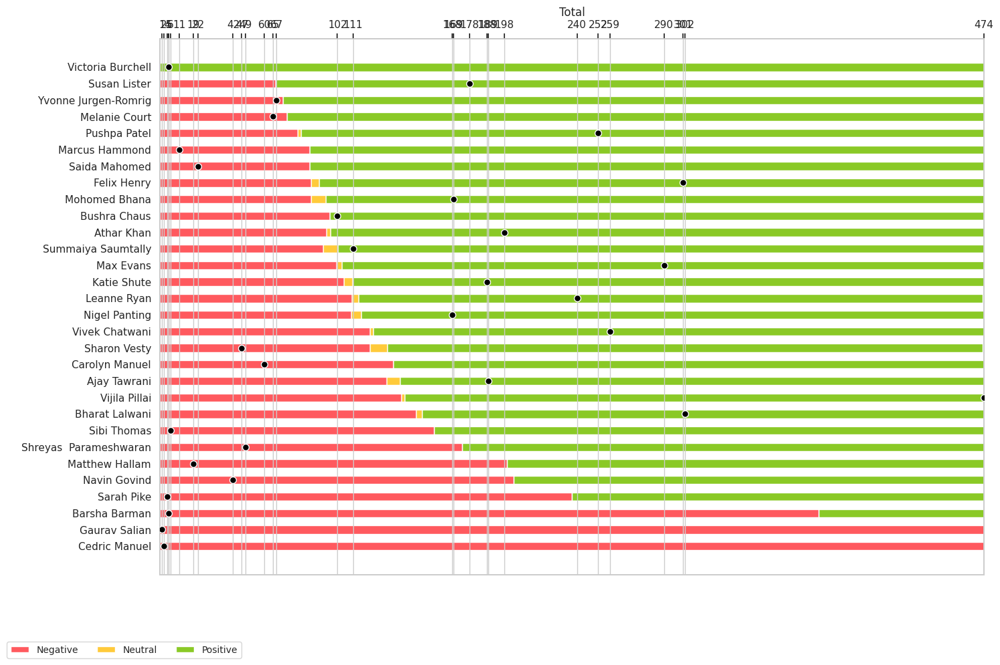

In [0]:
dm_sorted_df = dept_pivot_pd.sort_values(by="percentage_positive", ascending=False)
dm_sorted_df = dm_sorted_df[
    [
        "deptmanager",
        "percentage_positive",
        "percentage_negative",
        "percentage_neutral",
        "total",
    ]
]

dm_results = dm_sorted_df.set_index("deptmanager")[
    ["percentage_negative", "percentage_neutral", "percentage_positive"]
].T.to_dict("list")

sentiment_names = ["Negative", "Neutral", "Positive"]
custom_colors = ["#ff595e", "#ffca3a", "#8ac926"]


dm_scatter_data = dm_sorted_df[["total"]].copy()
dm_scatter_data["deptmanager"] = dm_sorted_df["deptmanager"]
dm_scatter_data = dm_scatter_data.set_index("deptmanager")


def bar_scatter(dm_results, sentiment_names, scatter_data):
    labels = list(dm_results.keys())
    data = np.array(list(dm_results.values()))
    data_cum = data.cumsum(axis=1)
    category_colors = custom_colors

    fig, ax1 = plt.subplots(figsize=(15, 10))
    ax1.invert_yaxis() 
    ax1.xaxis.set_visible(False)  
    ax1.set_xlim(0, 100)  


    for i, (colname, color) in enumerate(zip(sentiment_names, category_colors)):
        widths = data[:, i]
        starts = data_cum[:, i] - widths
        ax1.barh(labels, widths, left=starts, height=0.5, label=colname, color=color)


    ax2 = ax1.twiny()
    ax2.set_xlim(0,100) 
    ax2.set_xlabel("Total") 


    scatter_x = scatter_data["total"]
    scatter_y = [
        labels.index(manager) for manager in scatter_data.index
    ]
    ax2.scatter(
        scatter_x,
        scatter_y,
        color="black",
        edgecolor="white",
        zorder=5,
        s=50,
        marker="o",
    )

   
    ax2.set_xticks(scatter_x)
#    ax2.set_xticklabels([f"{int(val)}" for val in scatter_x], rotation=45, ha="right", size = 7)


    ax1.legend(
        ncol=len(sentiment_names),
        bbox_to_anchor=(0, 0), 
        loc="lower left",
        fontsize="small",
        bbox_transform=fig.transFigure, 
    )


    plt.tight_layout()
    return fig, ax1


bar_scatter(dm_results, sentiment_names, dm_scatter_data)
plt.tight_layout()
plt.show()

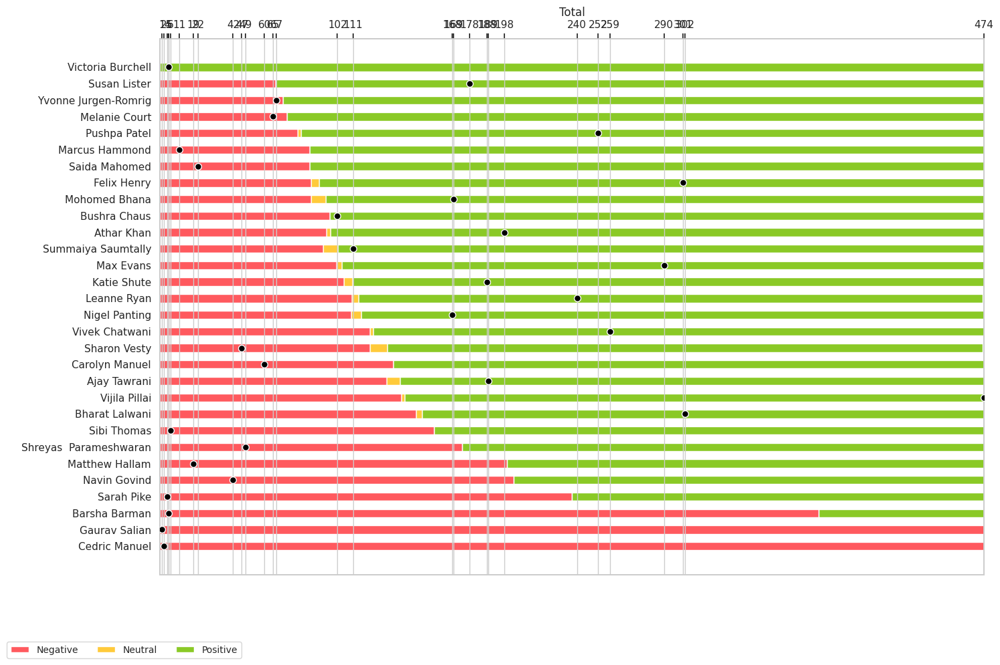

In [0]:
dm_sorted_df = dept_pivot_pd.sort_values(by="percentage_positive", ascending=False)
dm_sorted_df = dm_sorted_df[
    [
        "deptmanager",
        "percentage_positive",
        "percentage_negative",
        "percentage_neutral",
        "total",
    ]
]

dm_results = dm_sorted_df.set_index("deptmanager")[
    ["percentage_negative", "percentage_neutral", "percentage_positive"]
].T.to_dict("list")

sentiment_names = ["Negative", "Neutral", "Positive"]
custom_colors = ["#ff595e", "#ffca3a", "#8ac926"]


dm_scatter_data = dm_sorted_df[["total"]].copy()
dm_scatter_data["deptmanager"] = dm_sorted_df["deptmanager"]
dm_scatter_data = dm_scatter_data.set_index("deptmanager")


def bar_scatter(dm_results, sentiment_names, scatter_data):
    labels = list(dm_results.keys())
    data = np.array(list(dm_results.values()))
    data_cum = data.cumsum(axis=1)
    category_colors = custom_colors

    fig, ax1 = plt.subplots(figsize=(15, 10))
    ax1.invert_yaxis() 
    ax1.xaxis.set_visible(False)  
    ax1.set_xlim(0, 100)  


    for i, (colname, color) in enumerate(zip(sentiment_names, category_colors)):
        widths = data[:, i]
        starts = data_cum[:, i] - widths
        ax1.barh(labels, widths, left=starts, height=0.5, label=colname, color=color)


    ax2 = ax1.twiny()
    ax2.set_xlim(0,100) 
    ax2.set_xlabel("Total") 


    scatter_x = scatter_data["total"]
    scatter_y = [
        labels.index(manager) for manager in scatter_data.index
    ]
    ax2.scatter(
        scatter_x,
        scatter_y,
        color="black",
        edgecolor="white",
        zorder=5,
        s=50,
        marker="o",
    )

   
    ax2.set_xticks(scatter_x)
#    ax2.set_xticklabels([f"{int(val)}" for val in scatter_x], rotation=45, ha="right", size = 7)


    ax1.legend(
        ncol=len(sentiment_names),
        bbox_to_anchor=(0, 0), 
        loc="lower left",
        fontsize="small",
        bbox_transform=fig.transFigure, 
    )


    plt.tight_layout()
    return fig, ax1


bar_scatter(dm_results, sentiment_names, dm_scatter_data)
plt.tight_layout()
plt.show()

In [0]:
dm_scatter_data

,total
deptmanager,
1,5.0
5,178.0
6,67.0
2,65.0
16,252.0
23,11.0
12,22.0
25,301.0
21,169.0


In [0]:
print(dm_scatter_data.head())
print(len(dm_scatter_data))

print(len(scatter_x))
print(len(scatter_y))

             total
deptmanager       
1              5.0
5            178.0
6             67.0
2             65.0
16           252.0
30
30
30


In [0]:
print(scatter_x)
print(scatter_y)

deptmanager
1       5.0
5     178.0
6      67.0
2      65.0
16    252.0
23     11.0
12     22.0
25    301.0
21    169.0
4     102.0
0     198.0
14    111.0
13    290.0
8     188.0
7     240.0
15    168.0
28    259.0
22     47.0
19     60.0
24    189.0
18    474.0
20    302.0
17      6.0
26     49.0
27     19.0
3      42.0
9       4.0
10      5.0
11      1.0
29      2.0
Name: total, dtype: float64
Int64Index([ 1,  5,  6,  2, 16, 23, 12, 25, 21,  4,  0, 14, 13,  8,  7, 15, 28,
            22, 19, 24, 18, 20, 17, 26, 27,  3,  9, 10, 11, 29],
           dtype='int64', name='deptmanager')


#### 1.3 workgroup

In [0]:
# create spark dataframe
workgroup_pivot = spark.sql(
    "SELECT * FROM (SELECT WorkgroupName, sentiment FROM df) AS a PIVOT (COUNT(*) AS count FOR sentiment IN ('positive', 'negative', 'neutral'))"
)
workgroup_pivot.createOrReplaceTempView("workgroup_pivot")
workgroup_pivot.display()


# to pandas df and replace null by 0
workgroup_pivot_pd = workgroup_pivot.toPandas()
workgroup_pivot_pd.fillna(0, inplace=True)


# count volume by sentiment
workgroup_pivot_pd["total"] = (
    workgroup_pivot_pd["positive"]
    + workgroup_pivot_pd["negative"]
    + workgroup_pivot_pd["neutral"]
)


# volume to percentage
workgroup_pivot_pd["percentage_positive"] = round(
    workgroup_pivot_pd["positive"] / workgroup_pivot_pd["total"] * 100, 1
)
workgroup_pivot_pd["percentage_negative"] = round(
    workgroup_pivot_pd["negative"] / workgroup_pivot_pd["total"] * 100, 1
)
workgroup_pivot_pd["percentage_neutral"] = round(
    workgroup_pivot_pd["neutral"] / workgroup_pivot_pd["total"] * 100, 1
)
#workgroup_pivot_pd.drop(columns=["total"], inplace=True)
display(workgroup_pivot_pd)


# melt df
workgroup_pivot_pd_melted = workgroup_pivot_pd.melt(
    id_vars=["WorkgroupName"],
    value_vars=["percentage_positive", "percentage_negative", "percentage_neutral"],
    var_name="Sentiment",
    value_name="Percentage",
)


# descending ranking by positive rate
workgroup_pivot_pd_melted["percentage_positive"] = workgroup_pivot_pd_melted.apply(
    lambda row: workgroup_pivot_pd[
        workgroup_pivot_pd["WorkgroupName"] == row["WorkgroupName"]
    ]["percentage_positive"].values[0],
    axis=1,
)
workgroup_pivot_pd_melted = workgroup_pivot_pd_melted.sort_values(
    by="percentage_positive", ascending=False
)

WorkgroupName,positive,negative,neutral
Voice Escalated Enquiries,79,12,null
Voice Courier,9,4,null
Chat Arabic,2,null,null
Voice Flowers,23,13,null
Voice Orders,214,60,3
Voice N3S Enquiries,183,38,null
Chat Enquiries,45,17,2
Chat Reiss Int,7,15,null
Voice Faulty Items,39,7,null
Chat Pune,309,134,5


WorkgroupName,positive,negative,neutral,total,percentage_positive,percentage_negative,percentage_neutral
Voice Escalated Enquiries,79.0,12.0,0.0,91.0,86.8,13.2,0.0
Voice Courier,9.0,4.0,0.0,13.0,69.2,30.8,0.0
Chat Arabic,2.0,0.0,0.0,2.0,100.0,0.0,0.0
Voice Flowers,23.0,13.0,0.0,36.0,63.9,36.1,0.0
Voice Orders,214.0,60.0,3.0,277.0,77.3,21.7,1.1
Voice N3S Enquiries,183.0,38.0,0.0,221.0,82.8,17.2,0.0
Chat Enquiries,45.0,17.0,2.0,64.0,70.3,26.6,3.1
Chat Reiss Int,7.0,15.0,0.0,22.0,31.8,68.2,0.0
Voice Faulty Items,39.0,7.0,0.0,46.0,84.8,15.2,0.0
Chat Pune,309.0,134.0,5.0,448.0,69.0,29.9,1.1


In [0]:
workgroup_sen = (
    df.groupby(["WorkgroupName", "sentiment"])
    .count()
    .groupBy("WorkgroupName")
    .pivot("sentiment")
    .sum()
)

workgroup_sen = workgroup_sen.toPandas()

workgroup_sen["Total"] = workgroup_sen.sum(axis=1)
workgroup_sen = workgroup_sen.sort_values("Total", ascending=False)
#workgroup_sen = workgroup_sen.drop(columns=["Total"])
workgroup_sen = workgroup_sen.reset_index()

workgroup_sen_melted = workgroup_sen.melt(
    id_vars="WorkgroupName", var_name="Sentiment", value_name="Count"
)


/root/.ipykernel/395880/command-3369264611740776-222707240:11: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  workgroup_sen["Total"] = workgroup_sen.sum(axis=1)


#### 1.4 general manager

In [0]:
# create spark dataframe
generalmanager_pivot = spark.sql(
    "SELECT * FROM (SELECT GeneralManager, sentiment FROM df) AS a PIVOT (COUNT(*) AS count FOR sentiment IN ('positive', 'negative', 'neutral'))"
)
spark = SparkSession.builder.appName("DropNulls").getOrCreate()
generalmanager_pivot = generalmanager_pivot.dropna(subset=["GeneralManager"])
generalmanager_pivot.createOrReplaceTempView("generalmanager_pivot")
# generalmanager_pivot.display()


# to pandas df and replace null by 0
generalmanager_pivot_pd = generalmanager_pivot.toPandas()
generalmanager_pivot_pd.fillna(0, inplace=True)
# generalmanager_pivot_pd.display()


# count volume by sentiment
generalmanager_pivot_pd["total"] = (
    generalmanager_pivot_pd["positive"]
    + generalmanager_pivot_pd["negative"]
    + generalmanager_pivot_pd["neutral"]
)


# volume to percentage
generalmanager_pivot_pd["percentage_positive"] = round(
    generalmanager_pivot_pd["positive"] / generalmanager_pivot_pd["total"] * 100, 1
)
generalmanager_pivot_pd["percentage_negative"] = round(
    generalmanager_pivot_pd["negative"] / generalmanager_pivot_pd["total"] * 100, 1
)
generalmanager_pivot_pd["percentage_neutral"] = round(
    generalmanager_pivot_pd["neutral"] / generalmanager_pivot_pd["total"] * 100, 1
)
#generalmanager_pivot_pd.drop(columns=["total"], inplace=True)
display(generalmanager_pivot_pd)


# melt df
generalmanager_pivot_pd_melted = generalmanager_pivot_pd.melt(
    id_vars=["GeneralManager"],
    value_vars=["percentage_positive", "percentage_negative", "percentage_neutral"],
    var_name="Sentiment",
    value_name="Percentage",
)


# descending ranking by positive rate
generalmanager_pivot_pd_melted[
    "percentage_positive"
] = generalmanager_pivot_pd_melted.apply(
    lambda row: generalmanager_pivot_pd[
        generalmanager_pivot_pd["GeneralManager"] == row["GeneralManager"]
    ]["percentage_positive"].values[0],
    axis=1,
)
generalmanager_pivot_pd_melted = generalmanager_pivot_pd_melted.sort_values(
    by="percentage_positive", ascending=False
)

GeneralManager,positive,negative,neutral,total,percentage_positive,percentage_negative,percentage_neutral
Jacob Dilkes,27.0,6,0.0,33.0,81.8,18.2,0.0
Athar Khan,43.0,17,0.0,60.0,71.7,28.3,0.0
Jolyon Hammond,144.0,42,2.0,188.0,76.6,22.3,1.1
Meghna Dhar Newbigging,0.0,1,0.0,1.0,0.0,100.0,0.0
Mark Lambert,429.0,124,2.0,555.0,77.3,22.3,0.4
Kashish Hooda,24.0,18,0.0,42.0,57.1,42.9,0.0
Matthew Barnes,11.0,8,0.0,19.0,57.9,42.1,0.0
Saida Mahomed,145.0,32,0.0,177.0,81.9,18.1,0.0
Sibi Thomas,3.0,7,0.0,10.0,30.0,70.0,0.0
Michael Kelly,226.0,62,2.0,290.0,77.9,21.4,0.7


#### 1.5 week - month

In [0]:
time_columns = [
    "fshortmonthname",
    "fweek",
]

month_week = df_all.select(*[col(column) for column in time_columns])

month_week.createOrReplaceTempView("month_week")
month_week.display()

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3369264611889387>, line 2
      1 sns.barplot(
----> 2     data=dept_pivot_pd_melted,
      3     x="deptmanager",
      4     y="Percentage",
      5     hue="Sentiment",
      6     errorbar=None,
      7     dodge=False,
      8     palette=["salmon", "skyblue", "lightgreen"],
      9     ax=ax1
     10 )
     12 # Setting up the bar plot axis labels
     13 ax1.set_title("Sentiment Percentage by deptmanager", fontsize=16)

NameError: name 'dept_pivot_pd_melted' is not defined

In [0]:
month_week_pd = month_week.toPandas()
month_map = {'May': 5, 'Jun': 6, 'Jul': 7}
month_week_pd['Month'] = month_week_pd['fshortmonthname'].map(month_map)
agg_data = month_week_pd.groupby(['Month', 'fweek']).size().reset_index(name='RecordCount')
agg_data = agg_data.sort_values(by=['Month', 'fweek'])

agg_data.display()

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3369264611889387>, line 2
      1 sns.barplot(
----> 2     data=dept_pivot_pd_melted,
      3     x="deptmanager",
      4     y="Percentage",
      5     hue="Sentiment",
      6     errorbar=None,
      7     dodge=False,
      8     palette=["salmon", "skyblue", "lightgreen"],
      9     ax=ax1
     10 )
     12 # Setting up the bar plot axis labels
     13 ax1.set_title("Sentiment Percentage by deptmanager", fontsize=16)

NameError: name 'dept_pivot_pd_melted' is not defined

###2. dashboard

#### 2.0 custom

In [0]:
sentiment_names = ['Negative', 'Neutral', 'Positive']
custom_colors = ['#bc4749', '#124559', '#a7c957']

#### 2.1 Annotation text

In [0]:
# p1
text_p1 = "There are three departments in the domestic category (research scale): Chat Enquiries, Enquiries TP UK, and UK Enquiries. The data source is the sentiment analysis results provided by the AI language model. The figure above (Fig.1) shows the proportion of each sentiment in the three departments across the three sentiment categories, arranged in descending order according to the proportion of positive sentiment. The Chat Enquiries department received the highest percentage of positive sentiment, about 81.2%, while the UK Enquiries department received the lowest percentage of positive sentiment, at 75%. However, it is worth noting that the sample size of the latter is nearly ten times that of the former, and the error caused by the difference in sample size needs to be considered."
wrapped_text_p1 = "\n".join(wrap(text_p1, width=100))

# p2
text_p2 = "The chart displays the sentiment analysis results by Department Manager, with the percentage of each sentiment (bar) and the volume assigned to each manager (scatter) shown. Managers such as Victoria Burrell and Sadaf Qadri have the highest percentage of positive sentiment, while managers like Nike Thomas have the highest percentage of negative sentiment. It is worth taking volume into consideration as well."
wrapped_text_p2 = "\n".join(wrap(text_p2, width=100))

# p3
text_p3 = "This chart shows sentiment analysis results by workgroup. The 'Voice CH/S TS Customer Enquiries’ workgroup, led by Vanessa Kennedy, has the highest percentage of positive sentiment, while the 'Email UK/ROI COM Top' group, led by Kate Skelton, has the highest percentage of negative sentiment. These results highlight areas where team performance might influence customer feedback. However, the total volume of each workgroup should be taken into consideration when evaluating team performance."
wrapped_text_p3 = "\n".join(wrap(text_p3, width=100))

# p4
text_p4 = "This figure categorises sentiment analysis results by General Manager. Managers like Sadaf Mohamed and Rebecca Davison exhibit high positive sentiment percentages, while managers such as Nike Thomas show higher negative sentiment percentages."
wrapped_text_p4 = "\n".join(wrap(text_p4, width=100))

# p5
text_p5 = "The heatmap illustrates the percentage distribution of sentiments across various departments and managers. Darker shades indicate higher percentages of positive sentiment, while lighter shades indicate negative sentiment. The heatmap reveals patterns and areas where specific managers or departments consistently receive more positive or negative feedback, providing insights for targeted improvements."
wrapped_text_p5 = "\n".join(wrap(text_p5, width=100))

# p6
text_p6 = "This heatmap shows the volume of sentiments categorised by department and manager. Higher sentiment volumes are represented by darker shades. The chart highlights where the majority of customer feedback is concentrated, indicating which departments and managers receive the most feedback and may require more attention or resources."
wrapped_text_p6 = "\n".join(wrap(text_p6, width=100))

# p7
text_p7 = "This bar chart represents the distribution of sentiment volumes across different workgroups. Workgroups with higher volumes of feedback are at the top, indicating where customer feedback is most frequently directed. This data helps in understanding which workgroups are more engaged with customers and might need more support or recognition."
wrapped_text_p7 = "\n".join(wrap(text_p7, width=100))

# p8
text_p8 = "The above word cloud shows the frequency of each keyword extracted from the Categories column with a neutral sentiment. A larger word represents a higher frequency, indicating a potential common enquiry."
wrapped_text_p8 = "\n".join(wrap(text_p8, width=100))

# p9
text_p9 = "The above word cloud shows the frequency of each keyword extracted from the Categories column with a positive sentiment. A larger word represents a higher frequency, indicating a potential common enquiry. In this case, we can gain insights into which characteristics of customer service are more likely to receive positive feedback from customers, thereby further improving customer service and optimising the customer experience. (For example, ‘Friendly’, ‘Resolve’, ‘Polite’, ‘Effective’... can also be considered as customers' expectations.)"
wrapped_text_p9 = "\n".join(wrap(text_p9, width=100))

# p10
text_p10 = "The above word cloud shows the frequency of each keyword extracted from the Categories column with a negative sentiment. A larger word represents a higher frequency, indicating a potential common enquiry. In this case, it is very intuitive in showing the possible shortcomings in customer service and the customers’ dissatisfaction with specific services. By addressing these shortcomings, the likelihood of negative customer feedback can be effectively reduced."
wrapped_text_p10 = "\n".join(wrap(text_p10, width=100))

#### 2.2 Plotting

In [0]:
dept_pivot_pd_melted.display()

deptmanager,Sentiment,Percentage,percentage_positive
Victoria Burchell,percentage_positive,100.0,100.0
Victoria Burchell,percentage_negative,0.0,100.0
Victoria Burchell,percentage_neutral,0.0,100.0
Susan Lister,percentage_neutral,0.0,86.0
Susan Lister,percentage_positive,86.0,86.0
Susan Lister,percentage_negative,14.0,86.0
Yvonne Jurgen-Romrig,percentage_neutral,0.0,85.1
Yvonne Jurgen-Romrig,percentage_positive,85.1,85.1
Yvonne Jurgen-Romrig,percentage_negative,14.9,85.1
Melanie Court,percentage_neutral,0.0,84.6


In [0]:
dept_pivot_pd['deptmanager']
dept_pivot_pd['percentage_positive']

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3369264611889387>, line 2
      1 sns.barplot(
----> 2     data=dept_pivot_pd_melted,
      3     x="deptmanager",
      4     y="Percentage",
      5     hue="Sentiment",
      6     errorbar=None,
      7     dodge=False,
      8     palette=["salmon", "skyblue", "lightgreen"],
      9     ax=ax1
     10 )
     12 # Setting up the bar plot axis labels
     13 ax1.set_title("Sentiment Percentage by deptmanager", fontsize=16)

NameError: name 'dept_pivot_pd_melted' is not defined

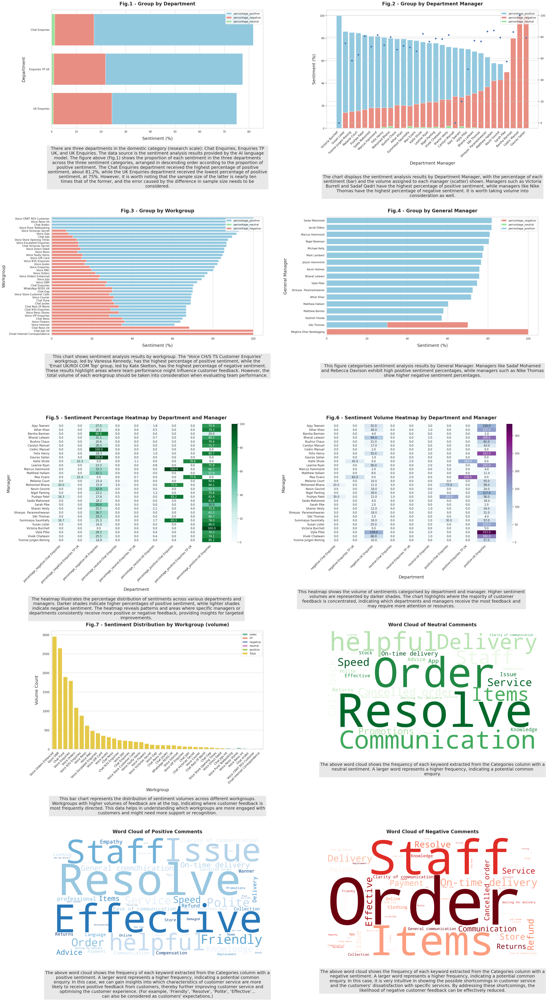

<Figure size 1600x900 with 0 Axes>

<Figure size 1600x900 with 0 Axes>

<Figure size 1600x900 with 0 Axes>

<Figure size 1600x900 with 0 Axes>

<Figure size 1600x900 with 0 Axes>

In [0]:
fig, axs = plt.subplots(5, 2, figsize=(36, 70), sharey=False)
plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9, wspace=0.3, hspace=0.75)
sns.set_theme(style="whitegrid")


# p1 - by department
plt.figure(figsize=(16, 9))
sns.barplot(
    data=dept_p_pd_melted,
    y="Department",
    x="Percentage",
    hue="Sentiment",
    errorbar=None,
    palette=["skyblue", "salmon", "lightgreen"],
    dodge=False,
    ax=axs[0, 0],
)
axs[0, 0].set_title(
    "Fig.1 - Group by Department", fontsize=20, fontweight="bold", pad=20
)
axs[0, 0].set_ylabel("Department", fontsize=18, labelpad=15)
axs[0, 0].set_xlabel("Sentiment (%)", fontsize=18, labelpad=15)
axs[0, 0].annotate(
    wrapped_text_p1,
    xy=(0.5, -0.5),
    xycoords="axes fraction",
    fontsize=18,
    ha="center",
    bbox=dict(facecolor="lightgrey", alpha=0.5, edgecolor="lightgrey"),
)


# p2 - by department manager
plt.figure(figsize=(16, 9))
sns.barplot(
    data=dept_pivot_pd_melted,
    x="deptmanager",
    y="Percentage",
    hue="Sentiment",
    errorbar=("ci", True),
    palette=["skyblue", "salmon", "lightgreen"],
    dodge=False,
    ax=axs[0, 1],
)
axs[0, 1].set_title(
    "Fig.2 - Group by Department Manager", fontsize=20, fontweight="bold", pad=20
)
axs[0, 1].set_xlabel("Department Manager", fontsize=18, labelpad=15)
axs[0, 1].set_ylabel("Sentiment (%)", fontsize=18, labelpad=15)
#axs[0, 1].tick_params(axis="x", labelrotation=45)
plt.setp(axs[0, 1].xaxis.get_majorticklabels(), rotation=45, ha="right", fontsize=12)
axs[0, 1].annotate(
    wrapped_text_p2,
    xy=(0.5, -0.58),
    xycoords="axes fraction",
    fontsize=18,
    ha="center",
    bbox=dict(facecolor="lightgrey", alpha=0.5, edgecolor="lightgrey"),
)

reversed_data_p2 = dept_pivot_pd.iloc[::-1]
axs2 = axs[0, 1].twinx()
axs2.scatter(reversed_data_p2['deptmanager'], reversed_data_p2['percentage_positive'])


# p3 - by workgroup
plt.figure(figsize=(16, 9))
sns.barplot(
    data=workgroup_pivot_pd_melted,
    y="WorkgroupName",
    x="Percentage",
    hue="Sentiment",
    errorbar=None,
    palette=["skyblue", "lightgreen", "salmon"],
    dodge=False,
    ax=axs[1, 0],
)
axs[1, 0].set_title(
    "Fig.3 - Group by Workgroup", fontsize=20, fontweight="bold", pad=20
)
axs[1, 0].set_ylabel("Workgroup", fontsize=18, labelpad=15)
axs[1, 0].set_xlabel("Sentiment (%)", fontsize=18, labelpad=15)
axs[1, 0].annotate(
    wrapped_text_p3,
    xy=(0.5, -0.35),
    xycoords="axes fraction",
    fontsize=18,
    ha="center",
    bbox=dict(facecolor="lightgrey", alpha=0.5, edgecolor="lightgrey"),
)


# p4 - by general manager
plt.figure(figsize=(16, 9))
sns.barplot(
    data=generalmanager_pivot_pd_melted,
    y="GeneralManager",
    x="Percentage",
    hue="Sentiment",
    errorbar=None,
    palette=["salmon", "lightgreen", "skyblue"],
    dodge=False,
    ax=axs[1, 1],
)
axs[1, 1].set_title(
    "Fig.4 - Group by General Manager", fontsize=20, fontweight="bold", pad=20
)
axs[1, 1].set_ylabel("General Manager", fontsize=18, labelpad=15)
axs[1, 1].set_xlabel("Sentiment (%)", fontsize=18, labelpad=15)
axs[1, 1].annotate(
    wrapped_text_p4,
    xy=(0.5, -0.35),
    xycoords="axes fraction",
    fontsize=18,
    ha="center",
    bbox=dict(facecolor="lightgrey", alpha=0.5, edgecolor="lightgrey"),
)


axs[0, 0].legend(loc="upper right")
axs[0, 1].legend(loc="upper right")
axs[1, 0].legend(loc="upper right")
axs[1, 1].legend(loc="upper right")


# p5, p6 [2,0] & [2,1] heatmap
heatmap_data_percentage = dept_grouped_pd.pivot_table(
    index="deptmanager",
    columns="Department",
    values=["percentage_positive", "percentage_negative", "percentage_neutral"],
    fill_value=0,
)
sns.heatmap(
    heatmap_data_percentage, annot=True, fmt=".1f", cmap="BuGn", cbar=True, ax=axs[2, 0]
)
# axs[2, 0].figure(figsize=(16, 9))
axs[2, 0].set_title(
    "Fig.5 - Sentiment Percentage Heatmap by Department and Manager",
    fontsize=20,
    fontweight="bold",
    pad=20,
)
axs[2, 0].set_xlabel("Department", fontsize=18, labelpad=15)
axs[2, 0].set_ylabel("Manager", fontsize=18, labelpad=15)
plt.setp(axs[2, 0].xaxis.get_majorticklabels(), rotation=45, ha="right", fontsize=12)
plt.setp(axs[2, 0].yaxis.get_majorticklabels(), fontsize=12)
axs[2, 0].annotate(
    wrapped_text_p5,
    xy=(0.5, -0.65),
    xycoords="axes fraction",
    fontsize=18,
    ha="center",
    bbox=dict(facecolor="lightgrey", alpha=0.5, edgecolor="lightgrey"),
)


heatmap_data = grouped_dept_pivot_pd.pivot_table(
    index="deptmanager",
    columns="Department",
    values=["positive", "negative", "neutral"],
    fill_value=0,
)
sns.heatmap(heatmap_data, annot=True, fmt=".1f", cmap="BuPu", cbar=True, ax=axs[2, 1])
# axs[2, 1].figure(figsize=(16, 9))
axs[2, 1].set_title(
    "Fig.6 - Sentiment Volume Heatmap by Department and Manager",
    fontsize=20,
    fontweight="bold",
    pad=20,
)
axs[2, 1].set_xlabel("Department", fontsize=18, labelpad=15)
axs[2, 1].set_ylabel("Manager", fontsize=18, labelpad=15)
plt.setp(axs[2, 1].xaxis.get_majorticklabels(), rotation=45, ha="right", fontsize=12)
plt.setp(axs[2, 1].yaxis.get_majorticklabels(), fontsize=12)
axs[2, 1].annotate(
    wrapped_text_p6,
    xy=(0.5, -0.55),
    xycoords="axes fraction",
    fontsize=18,
    ha="center",
    bbox=dict(facecolor="lightgrey", alpha=0.5, edgecolor="lightgrey"),
)


# p7
plt.figure(figsize=(16, 9))
ax = sns.barplot(
    data=workgroup_sen_melted,
    x="WorkgroupName",
    y="Count",
    hue="Sentiment",
    palette="Set2",
    errorbar=None,
    dodge=False,
    ax=axs[3, 0],
)
axs[3, 0].set_title(
    "Fig.7 - Sentiment Distribution by Workgroup (volume)",
    fontsize=20,
    fontweight="bold",
    pad=20,
)
axs[3, 0].set_xlabel("Workgroup", fontsize=18, labelpad=15)
axs[3, 0].set_ylabel("Volume Count", fontsize=18, labelpad=15)
plt.setp(axs[3, 0].xaxis.get_majorticklabels(), rotation=45, ha="right", fontsize=12)
plt.setp(axs[3, 0].yaxis.get_majorticklabels(), fontsize=12)
axs[3, 0].legend(loc="upper right")
axs[3, 0].annotate(
    wrapped_text_p7,
    xy=(0.5, -0.55),
    xycoords="axes fraction",
    fontsize=18,
    ha="center",
    bbox=dict(facecolor="lightgrey", alpha=0.5, edgecolor="lightgrey"),
)
# p7
# sns.violinplot(x='Month', y='fweek', data=month_week_pd, scale='count', bw_adjust=.5, cut=1, linewidth=1, palette="Set3", ax=axs[3, 0])
# axs[3, 0].set_xlabel('Month')
# axs[3, 0].set_ylabel('Week Number (from Febuary)')
# axs[3, 0].set_title('2024 Qtr2 Record Time Volume Distribution - Violin Plot')


# p8, p9, p10 - wordclouds
sentiments = ["positive", "negative", "neutral"]
colormaps = {"positive": "Blues", "negative": "Reds", "neutral": "Greens"}
word_freqs = {}

for sentiment in sentiments:

    filtered_df = df.filter(df["sentiment"] == sentiment)
    filtered_df = filtered_df.withColumn(
        "Category", F.explode(F.split(filtered_df["Categories"], ","))
    )
    category_counts = filtered_df.groupBy("Category").count().collect()
    word_freq = {row["Category"]: row["count"] for row in category_counts}
    word_freqs[sentiment] = word_freq

positions = {"neutral": (3, 1), "positive": (4, 0), "negative": (4, 1)}
for sentiment in sentiments:
    wordcloud = WordCloud(
        width=1600,
        height=900,
        background_color="white",
        colormap=colormaps[sentiment],
        relative_scaling=0.5,
    ).generate_from_frequencies(word_freqs[sentiment])
    row, col = positions[sentiment]
    axs[row, col].imshow(wordcloud, interpolation="bilinear")
    axs[row, col].set_title(
        f"Word Cloud of {sentiment.capitalize()} Comments",
        fontsize=20,
        fontweight="bold",
        pad=20,
    )
    axs[row, col].axis("off")

axs[3, 1].annotate(
    wrapped_text_p8,
    xy=(0.5, -0.22),
    xycoords="axes fraction",
    fontsize=18,
    ha="center",
    bbox=dict(facecolor="lightgrey", alpha=0.5, edgecolor="lightgrey"),
)
axs[4, 0].annotate(
    wrapped_text_p9,
    xy=(0.5, -0.35),
    xycoords="axes fraction",
    fontsize=18,
    ha="center",
    bbox=dict(facecolor="lightgrey", alpha=0.5, edgecolor="lightgrey"),
)
axs[4, 1].annotate(
    wrapped_text_p10,
    xy=(0.5, -0.3),
    xycoords="axes fraction",
    fontsize=18,
    ha="center",
    bbox=dict(facecolor="lightgrey", alpha=0.5, edgecolor="lightgrey"),
)


plt.tight_layout()
# plt.text(10,10,  "test annotation", color='black',fontsize=15, bbox=dict(facecolor='lightgrey',alpha=0.5, edgecolor='lightgrey'))
plt.show()

## pivot sample

In [0]:
pivoteddata = spark.sql(
    "Select * from (Select Workgroupname,department, id,sentiment  from df_all) as a  pivot (count(id) as count for sentiment in ('positive','negative','neutral'))"
)
pivoteddata.createOrReplaceTempView("pivoteddata")

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3369264611889387>, line 2
      1 sns.barplot(
----> 2     data=dept_pivot_pd_melted,
      3     x="deptmanager",
      4     y="Percentage",
      5     hue="Sentiment",
      6     errorbar=None,
      7     dodge=False,
      8     palette=["salmon", "skyblue", "lightgreen"],
      9     ax=ax1
     10 )
     12 # Setting up the bar plot axis labels
     13 ax1.set_title("Sentiment Percentage by deptmanager", fontsize=16)

NameError: name 'dept_pivot_pd_melted' is not defined

In [0]:
pivoteddata.display()

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3369264611889387>, line 2
      1 sns.barplot(
----> 2     data=dept_pivot_pd_melted,
      3     x="deptmanager",
      4     y="Percentage",
      5     hue="Sentiment",
      6     errorbar=None,
      7     dodge=False,
      8     palette=["salmon", "skyblue", "lightgreen"],
      9     ax=ax1
     10 )
     12 # Setting up the bar plot axis labels
     13 ax1.set_title("Sentiment Percentage by deptmanager", fontsize=16)

NameError: name 'dept_pivot_pd_melted' is not defined

In [0]:
cleaned_pivot = spark.sql(
    "Select RootResponseName1,ResponseName1,Wkno,call_date,case when positive is null then 0 else positive end as positive,case when negative is null then 0 else negative end as negative,case when neutral is null then 0 else neutral end as neutral,(case when positive is null then 0 else positive end + case when neutral is null then 0 else neutral end + case when negative is null then 0 else negative end) as total,(case when positive is null then 0 else positive end + case when neutral is null then 0 else neutral end) / (case when positive is null then 0 else positive end + case when neutral is null then 0 else neutral end + case when negative is null then 0 else negative end) as sentiment_score from pivoteddata where  rootresponsename1 is not null"
).toPandas


---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3369264611889387>, line 2
      1 sns.barplot(
----> 2     data=dept_pivot_pd_melted,
      3     x="deptmanager",
      4     y="Percentage",
      5     hue="Sentiment",
      6     errorbar=None,
      7     dodge=False,
      8     palette=["salmon", "skyblue", "lightgreen"],
      9     ax=ax1
     10 )
     12 # Setting up the bar plot axis labels
     13 ax1.set_title("Sentiment Percentage by deptmanager", fontsize=16)

NameError: name 'dept_pivot_pd_melted' is not defined

---

In [0]:
overall_sentiment = df_all.groupBy(df_all.sentiment).count()
print(type(overall_sentiment))
display(overall_sentiment)

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3369264611889387>, line 2
      1 sns.barplot(
----> 2     data=dept_pivot_pd_melted,
      3     x="deptmanager",
      4     y="Percentage",
      5     hue="Sentiment",
      6     errorbar=None,
      7     dodge=False,
      8     palette=["salmon", "skyblue", "lightgreen"],
      9     ax=ax1
     10 )
     12 # Setting up the bar plot axis labels
     13 ax1.set_title("Sentiment Percentage by deptmanager", fontsize=16)

NameError: name 'dept_pivot_pd_melted' is not defined

In [0]:
overall_sentiment_pd = overall_sentiment.toPandas()

plt.bar(overall_sentiment_pd['sentiment'], overall_sentiment_pd['count'])
plt.ylabel('count')
plt.xlabel('sentiment')
plt.title('Figure 1 - zenlive9 domestic lm output')

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3369264611889387>, line 2
      1 sns.barplot(
----> 2     data=dept_pivot_pd_melted,
      3     x="deptmanager",
      4     y="Percentage",
      5     hue="Sentiment",
      6     errorbar=None,
      7     dodge=False,
      8     palette=["salmon", "skyblue", "lightgreen"],
      9     ax=ax1
     10 )
     12 # Setting up the bar plot axis labels
     13 ax1.set_title("Sentiment Percentage by deptmanager", fontsize=16)

NameError: name 'dept_pivot_pd_melted' is not defined

In [0]:
sns.set_theme(style="ticks")

f, ax = plt.subplots(figsize=(7, 5))
sns.despine(f)
sns.histplot(
    overall_sentiment,
    x="sentiment", hue="sentiment",
    multiple="stack",
    palette="light:m_r",
    edgecolor=".3",
    linewidth=.5,
    log_scale=True,
)
ax.xaxis.set_major_formatter(mpl.ticker.ScalarFormatter())
#ax.set_xticks([500, 1000, 2000, 5000, 10000])

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3369264611889387>, line 2
      1 sns.barplot(
----> 2     data=dept_pivot_pd_melted,
      3     x="deptmanager",
      4     y="Percentage",
      5     hue="Sentiment",
      6     errorbar=None,
      7     dodge=False,
      8     palette=["salmon", "skyblue", "lightgreen"],
      9     ax=ax1
     10 )
     12 # Setting up the bar plot axis labels
     13 ax1.set_title("Sentiment Percentage by deptmanager", fontsize=16)

NameError: name 'dept_pivot_pd_melted' is not defined

### temp

In [0]:
dept_pivot_pd.display()

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3369264611889387>, line 2
      1 sns.barplot(
----> 2     data=dept_pivot_pd_melted,
      3     x="deptmanager",
      4     y="Percentage",
      5     hue="Sentiment",
      6     errorbar=None,
      7     dodge=False,
      8     palette=["salmon", "skyblue", "lightgreen"],
      9     ax=ax1
     10 )
     12 # Setting up the bar plot axis labels
     13 ax1.set_title("Sentiment Percentage by deptmanager", fontsize=16)

NameError: name 'dept_pivot_pd_melted' is not defined

In [0]:
# p2 - by department manager
plt.figure(figsize=(16, 9))
sns.barplot(
    data=dept_pivot_pd_melted,
    y="deptmanager",
    x="Percentage",
    hue="Sentiment",
    errorbar=("ci", True),
    palette=["skyblue", "salmon", "lightgreen"],
    dodge=False,
    ax=axs[0, 1],
)
axs[0, 1].set_title(
    "Fig.2 - Group by Department Manager", fontsize=20, fontweight="bold", pad=20
)
axs[0, 1].set_ylabel("Department Manager", fontsize=18, labelpad=15)
axs[0, 1].set_xlabel("Sentiment (%)", fontsize=18, labelpad=15)
axs[0, 1].annotate(
    "annotation",
    xy=(0.5, -0.18),
    xycoords="axes fraction",
    fontsize=18,
    ha="center",
    bbox=dict(facecolor="lightgrey", alpha=0.5, edgecolor="lightgrey"),
)




---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3369264611889387>, line 2
      1 sns.barplot(
----> 2     data=dept_pivot_pd_melted,
      3     x="deptmanager",
      4     y="Percentage",
      5     hue="Sentiment",
      6     errorbar=None,
      7     dodge=False,
      8     palette=["salmon", "skyblue", "lightgreen"],
      9     ax=ax1
     10 )
     12 # Setting up the bar plot axis labels
     13 ax1.set_title("Sentiment Percentage by deptmanager", fontsize=16)

NameError: name 'dept_pivot_pd_melted' is not defined

In [0]:
#p2-draft
dept_pivot_pd_melted = dept_pivot_pd.sort_values(by="percentage_positive", ascending=False)

bar_data = dept_pivot_pd_melted.melt(
    id_vars=["deptmanager"],
    value_vars=["percentage_positive", "percentage_negative", "percentage_neutral"],
    var_name="Sentiment",
    value_name="Percentage"
)

# Map sentiment labels for better readability
sentiment_labels = {
    "percentage_positive": "Positive",
    "percentage_negative": "Negative",
    "percentage_neutral": "Neutral"
}
bar_data["Sentiment"] = bar_data["Sentiment"].map(sentiment_labels)



# Bar plot
sns.barplot(
    data=bar_data,
    x="Percentage",
    y="deptmanager",
    hue="Sentiment",
    palette=["skyblue", "salmon", "lightgreen"],
    dodge=False,
    ax=ax1
)
ax1.set_title(
    "Fig.2 - Group by Department Manager", fontsize=20, fontweight="bold", pad=20
)
ax1.set_xlabel("Sentiment (%)", fontsize=18, labelpad=15)
ax1.set_ylabel("Department Manager", fontsize=18, labelpad=15)

# Create a secondary y-axis for the total volume
ax2 = ax1.twiny()

# Line plot on the secondary y-axis
sns.lineplot(
    data=dept_pivot_pd_melted,
    x='total',
    y='deptmanager',
    marker="o",
    color='blue',
    ax=ax2
)

# Set the label for the secondary x-axis
ax2.set_xlabel('Total Volume', fontsize=18, labelpad=15)
ax2.xaxis.set_label_position('top') 

---------------------------------------------------------------------------
NameError                                 Traceback (most recent call last)
File <command-3369264611889387>, line 2
      1 sns.barplot(
----> 2     data=dept_pivot_pd_melted,
      3     x="deptmanager",
      4     y="Percentage",
      5     hue="Sentiment",
      6     errorbar=None,
      7     dodge=False,
      8     palette=["salmon", "skyblue", "lightgreen"],
      9     ax=ax1
     10 )
     12 # Setting up the bar plot axis labels
     13 ax1.set_title("Sentiment Percentage by deptmanager", fontsize=16)

NameError: name 'dept_pivot_pd_melted' is not defined